In [1]:
# Load your dataset into a Python list or pandas DataFrame. For demonstration, 
# let's assume we have a list of documents called documents.
import pandas as pd
documents = pd.read_csv("MyChart.csv", encoding = "ISO-8859-1")
documents.head()

C:\Users\ahwah\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


,Review
0,Convenient
1,Best way to keep my medical needs in the loop.
2,Doesn't work any more. I have called to reset ...
3,Excellent
4,Easy to use


In [2]:
print(len(documents))

39999


In [3]:
#!pip install tqdm
#!pip install pandas transformers nltk langdetect tqdm pandarallel

## Preprocessing

In [4]:
import pandas as pd
import nltk
import spacy
import re
from textblob import TextBlob
from tqdm import tqdm

# Load Spacy English model
nlp = spacy.load("en_core_web_sm")

# Create a combined stopwords list from NLTK and Spacy
STOPWORDS_DICT = {lang: set(nltk.corpus.stopwords.words(lang)) for lang in nltk.corpus.stopwords.fileids()}
sw_spacy = set(nlp.Defaults.stop_words)
combined_stopwords = STOPWORDS_DICT['english'].union(sw_spacy)

# Assuming your DataFrame is named `df` and the text column is named 'Review'
tqdm.pandas(desc="Processing Reviews")

def clean_tweets(review):
    # Convert to lowercase
    review = review.lower()
    
    # Remove hashtags and mentions
    review = " ".join(word for word in review.split() if word[0] not in ['#', '@'])
    
    # Remove stop words
    words = [word for word in review.split() if word not in combined_stopwords]
    review = " ".join(words)
    
    # Remove special characters, non-alphanumeric characters, and digits
    review = re.sub(r'[^\w\s]', '', review)
    review = re.sub('[^A-Za-z0-9]+', ' ', review)
    review = ' '.join(word for word in review.split() if not word.isdigit())
    
    # Remove words that are less than three letters
    words = [word for word in review.split() if len(word) > 2]
    review = " ".join(words)
    
    # Lemmatize each word
    sent = TextBlob(review)
    review = " ".join([w.lemmatize() for w in sent.words])
    
    return review

# Apply the cleaning function to each review
documents['Processed Review'] = documents['Review'].astype(str).progress_apply(clean_tweets)

# Optional: Replace 'Review' with 'Processed Review' values
documents['Review'] = documents['Processed Review']
documents.drop(columns=['Processed Review'], inplace=True)

# Display the DataFrame to verify the changes
print(documents.head())


C:\Users\ahwah\anaconda3\lib\site-packages\thinc\compat.py:36: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  hasattr(torch, "has_mps")
C:\Users\ahwah\anaconda3\lib\site-packages\thinc\compat.py:37: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  and torch.has_mps  # type: ignore[attr-defined]
Processing Reviews: 100%|██████████| 39999/39999 [00:10<00:00, 3638.64it/s]

                                              Review
0                                         convenient
1                         best way medical need loop
2  work more called reset password got time could...
3                                          excellent
4                                           easy use


## Extract ROBERTA Embeddings

In [5]:
from transformers import RobertaTokenizer, RobertaModel
import torch
from tqdm.auto import tqdm  # Import tqdm for progress bar functionality

# Initialize the RoBERTa tokenizer and model
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')
model = RobertaModel.from_pretrained('roberta-base')

def get_roberta_bigram_embeddings(text):
    # Tokenize the input text and add '<s>' and '</s>' tokens
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=512)
    
    # Get embeddings
    with torch.no_grad():
        outputs = model(**inputs)
    
    # Extract token embeddings (excluding special tokens '<s>' and '</s>')
    token_embeddings = outputs.last_hidden_state[:, 1:-1, :]  # Exclude <s> and </s> embeddings
    
    # Concatenate adjacent token embeddings to simulate "bigram" embeddings
    bigram_embeddings = torch.cat((token_embeddings[:, :-1, :], token_embeddings[:, 1:, :]), dim=-1)
    
    return bigram_embeddings.squeeze().numpy()

# Assuming 'documents' is a DataFrame with a 'Review' column containing text data
# Wrap the apply function with tqdm to display a progress bar
tqdm.pandas(desc="Processing Reviews")
documents['RoBERTa Bigram Embeddings'] = documents['Review'].progress_apply(lambda x: get_roberta_bigram_embeddings(x).tolist())


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

C:\Users\ahwah\anaconda3\lib\site-packages\huggingface_hub\file_download.py:149: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\ahwah\.cache\huggingface\hub\models--roberta-base. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Processing Reviews:   0%|          | 0/39999 [00:00<?, ?it/s]

## Dimensionality Reduction


In [6]:
import umap
import numpy as np

# Assuming 'documents' is a DataFrame and 'BERT Bigram Embeddings' contains the embeddings for each document
embeddings_list = documents['RoBERTa Bigram Embeddings'].tolist()

# Expected size of each embedding
expected_embedding_size = 1536  # Adjust based on your actual embedding size

# Filter out or fix embeddings that do not have the expected size
fixed_embeddings_list = []
for embedding in embeddings_list:
    np_embedding = np.array(embedding)  # Convert embedding to NumPy array
    if np_embedding.shape[0] == expected_embedding_size:
        fixed_embeddings_list.append(np_embedding)
    else:
        # If the embedding size is incorrect, append a placeholder of zeros
        fixed_embeddings_list.append(np.zeros(expected_embedding_size))

# Now that each embedding is an array of the expected size, stack them correctly
embeddings_array = np.vstack(fixed_embeddings_list)

# Initialize UMAP with the desired parameters
reducer = umap.UMAP(n_neighbors=10, n_components=2, metric='euclidean')

# Fit UMAP on the corrected embeddings array and transform the embeddings
umap_embeddings = reducer.fit_transform(embeddings_array)

# Optionally, adjust the number of components by changing n_components in UMAP

# Display the DataFrame to verify the changes
print(documents.head())

                                              Review  \
0                                         convenient   
1                         best way medical need loop   
2  work more called reset password got time could...   
3                                          excellent   
4                                           easy use   

                           RoBERTa Bigram Embeddings  
0  [-0.1452673375606537, 0.1405470073223114, 0.14...  
1  [[-0.037797316908836365, -0.1682499647140503, ...  
2  [[0.008199881762266159, -0.28373563289642334, ...  
3  [-0.13398528099060059, 0.18557599186897278, -0...  
4  [-0.10622073709964752, -0.14595063030719757, -...  


## Evaluation Using silhouette_score

In [8]:
from sklearn.metrics import silhouette_score
import hdbscan
import numpy as np
import umap

# Assuming `embeddings_array` is your 2D array of BERT embeddings or dimensionally reduced embeddings
# Define your min and max values for min_cluster_size
min_cluster_size_range = range(2, 100)  # For example, from 5 to 15

# List to store the results
results = []

for min_cluster_size in min_cluster_size_range:
    # Perform HDBSCAN clustering
    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, metric='euclidean', cluster_selection_method='eom')
    cluster_labels = clusterer.fit_predict(umap_embeddings)
    
    # Calculate the silhouette score, ensuring we have more than one cluster (excluding noise)
    unique_clusters = np.unique(cluster_labels)
    num_clusters_excluding_noise = len(unique_clusters) - (1 if -1 in unique_clusters else 0)

    if num_clusters_excluding_noise > 1:
        # Exclude noise points for silhouette calculation by filtering out '-1' labels
        filtered_labels = cluster_labels[cluster_labels != -1]
        filtered_embeddings = embeddings_array[cluster_labels != -1]
        score = silhouette_score(filtered_embeddings, filtered_labels)
    else:
        score = None  # Silhouette score is not meaningful or calculable for this configuration
    
    # Store the results
    results.append((min_cluster_size, score))
    print(f"min_cluster_size: {min_cluster_size}, Silhouette Score: {score}")

# Optional: Find the min_cluster_size with the highest silhouette score
best_result = max(results, key=lambda x: x[1] if x[1] is not None else -np.inf)
print(f"Best min_cluster_size: {best_result[0]} with Silhouette Score: {best_result[1]}")


min_cluster_size: 2, Silhouette Score: 0.021782811459930478
min_cluster_size: 3, Silhouette Score: 0.09553868385751332
min_cluster_size: 4, Silhouette Score: 0.11406362555901521
min_cluster_size: 5, Silhouette Score: 0.10456699647082505
min_cluster_size: 6, Silhouette Score: 0.11685816970347189
min_cluster_size: 7, Silhouette Score: 0.11778199996737145
min_cluster_size: 8, Silhouette Score: 0.11490877812955089
min_cluster_size: 9, Silhouette Score: 0.965306059221989
min_cluster_size: 10, Silhouette Score: 0.965137750751524
min_cluster_size: 11, Silhouette Score: 0.9663955667523206
min_cluster_size: 12, Silhouette Score: 0.9656199194624948
min_cluster_size: 13, Silhouette Score: 0.9640287688784287
min_cluster_size: 14, Silhouette Score: 0.9644394166519616
min_cluster_size: 15, Silhouette Score: 0.9634250143594307
min_cluster_size: 16, Silhouette Score: 0.9640460581896362
min_cluster_size: 17, Silhouette Score: 0.9634685721545263
min_cluster_size: 18, Silhouette Score: 0.9538980240584622

## Clustering

In [9]:
# With the reduced embeddings, we can apply clustering techniques like HDBSCAN to identify topics.


import hdbscan

# Apply HDBSCAN clustering
cluster = hdbscan.HDBSCAN(min_cluster_size=best_result[0], metric='euclidean', cluster_selection_method='eom')
cluster_labels = cluster.fit_predict(umap_embeddings)

# Add the cluster labels to the DataFrame
documents['Topic'] = cluster_labels


## Analyzing the Clusters


In [10]:
# After clustering, you can analyze the clusters to identify the topics. A simple way is to look at 
# the most representative documents or the most frequent words in each cluster.

import spacy

nlp = spacy.load("en_core_web_sm")

def extract_entities(text):
    doc = nlp(text)
    return [ent.text for ent in doc.ents]

# Extract entities for each document
documents['Entities'] = documents['Review'].apply(extract_entities)

# Analyze clusters
for topic in sorted(documents['Topic'].unique()):
    print(f"Topic {topic}:")
    sample_docs = documents[documents['Topic'] == topic]['Review'].head()
    for doc in sample_docs:
        print(f"- {doc[:100]}...")  # Print the beginning of each document


Topic -1:
- easy important...
- hard senior...
- loving organized...
- thank you...
- loved...
Topic 0:
- best way medical need loop...
- work more called reset password got time couldnt reset password again got email cant login again pla...
- let doctor see inform educate speak them that advocating myself ive kicked small town practice...
- fact password change function requires current password youre generally creating new password idea w...
- app convenient easy use...
Topic 1:
- awesome...
- awesome...
- awesome...
- awesome...
- awesome...
Topic 2:
- user friendly...
- userfriendly...
- user friendly...
- user friendly...
- user friendly...
Topic 3:
- love app...
- love app...
- love app...
- love app...
- love app...
Topic 4:
- easy use...
- easy use...
- easy use...
- easy use...
- easy use...
Topic 5:
- helpful...
- helpful...
- helpful...
- helpful...
- helpful...
Topic 6:
- confusing...
- confusing...
- confusing...
- confusing...
- confusing...
Topic 7:
- app helpful...
- ap

## Word Clouds for Visualizing Topics

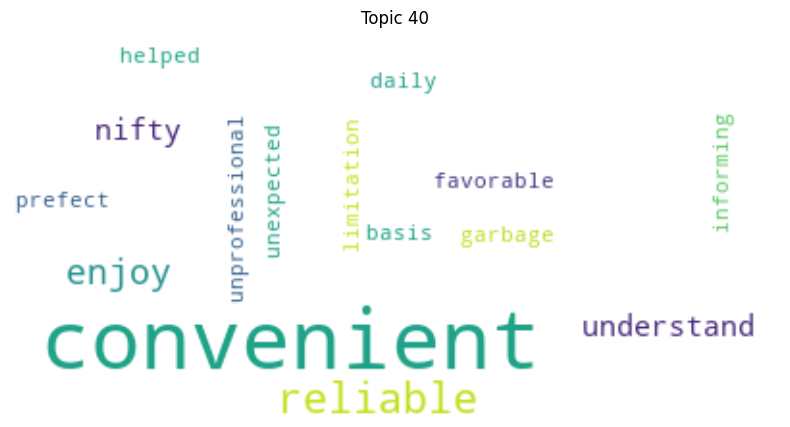

Top keywords for Topic 40: ['convenient', 'reliable', 'enjoy', 'understand', 'nifty', 'daily', 'basis', 'prefect', 'limitation', 'helped', 'garbage', 'unprofessional', 'unexpected', 'favorable', 'informing']


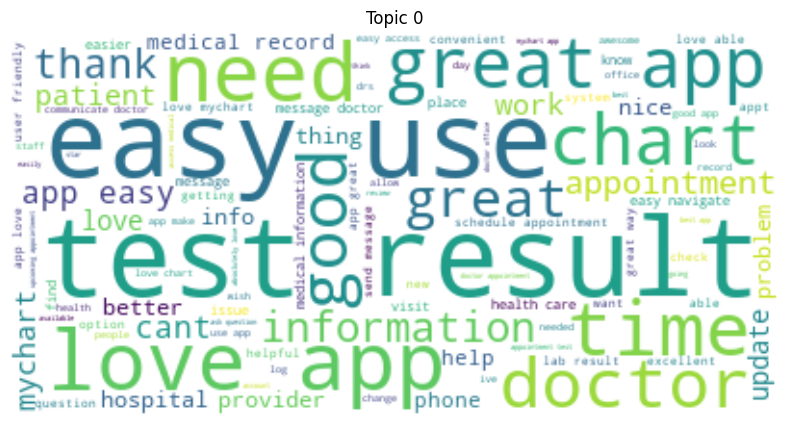

Top keywords for Topic 0: ['app', 'easy', 'love', 'appointment', 'doctor', 'result', 'use', 'great', 'test', 'medical', 'information', 'message', 'time', 'need', 'like', 'mychart', 'health', 'able', 'chart', 'good']


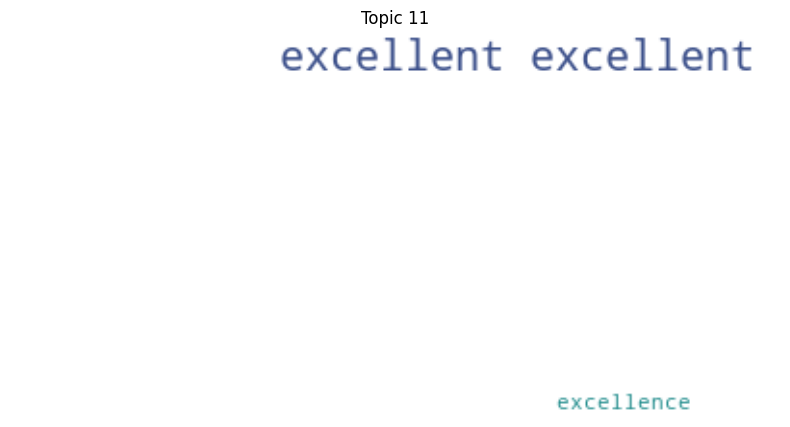

Top keywords for Topic 11: ['excellent', 'excellence']


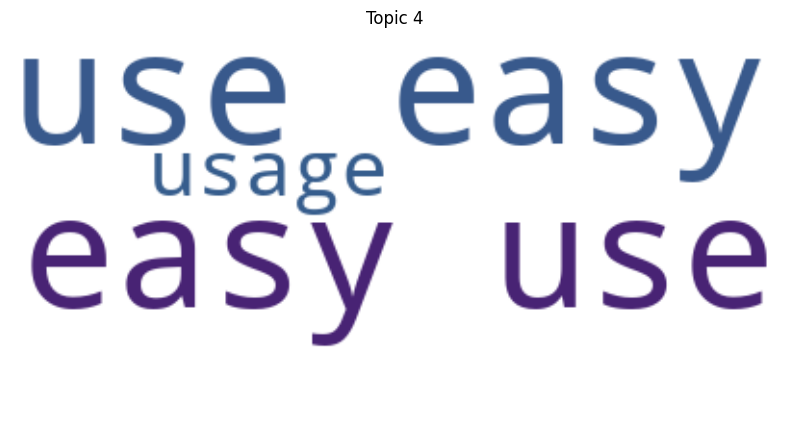

Top keywords for Topic 4: ['easy', 'use', 'usage']


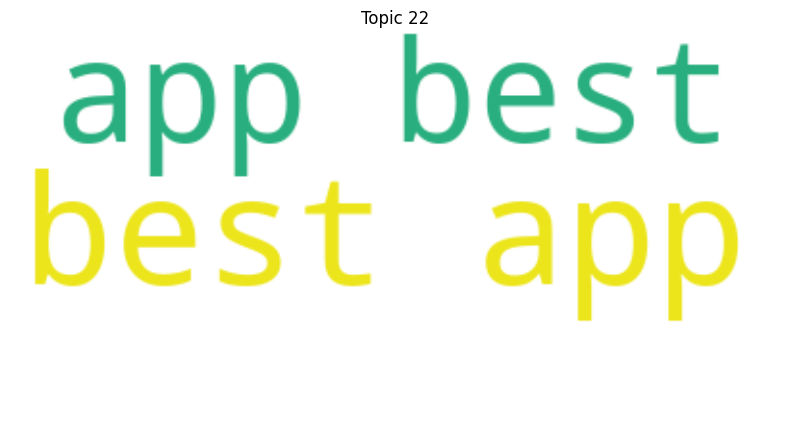

Top keywords for Topic 22: ['best', 'app']


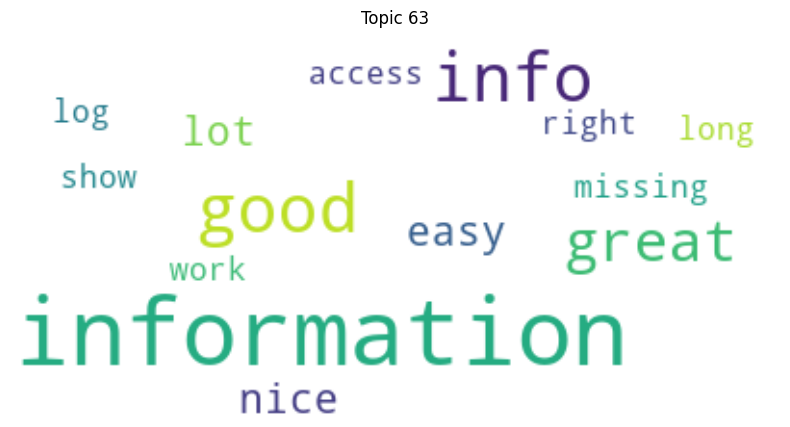

Top keywords for Topic 63: ['information', 'info', 'good', 'great', 'nice', 'easy', 'lot', 'right', 'missing', 'show', 'get', 'access', 'log', 'long', 'work']


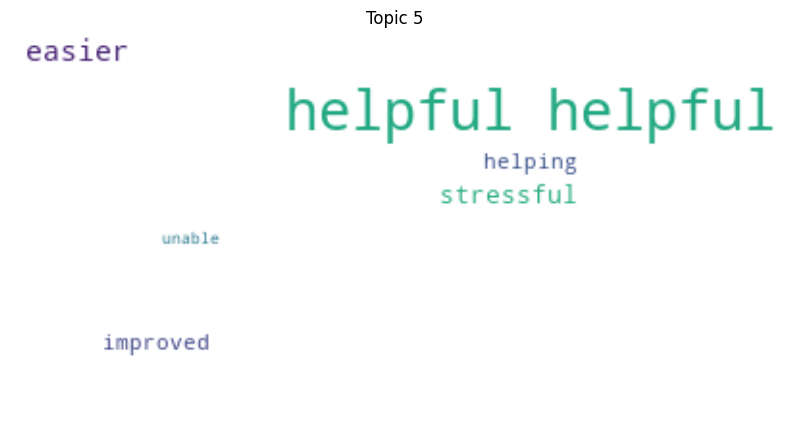

Top keywords for Topic 5: ['helpful', 'easier', 'stressful', 'helping', 'improved', 'unable']


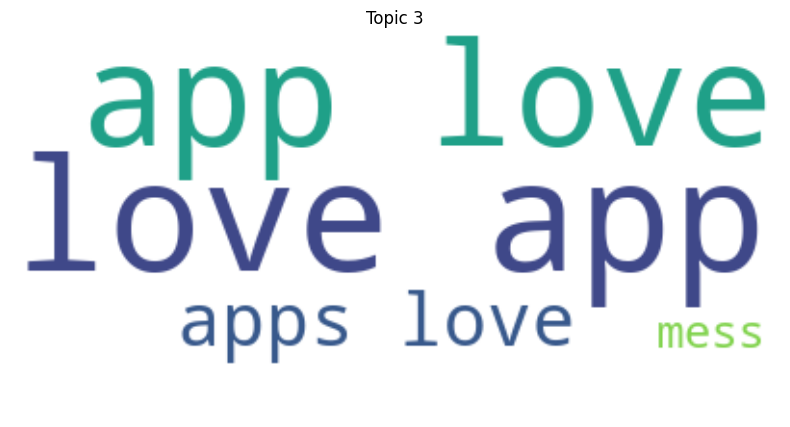

Top keywords for Topic 3: ['love', 'app', 'apps', 'like', 'mess']


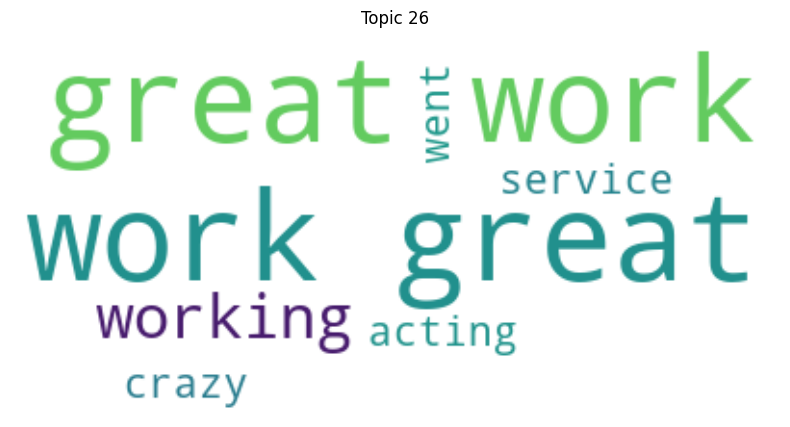

Top keywords for Topic 26: ['great', 'work', 'working', 'went', 'acting', 'crazy', 'service']


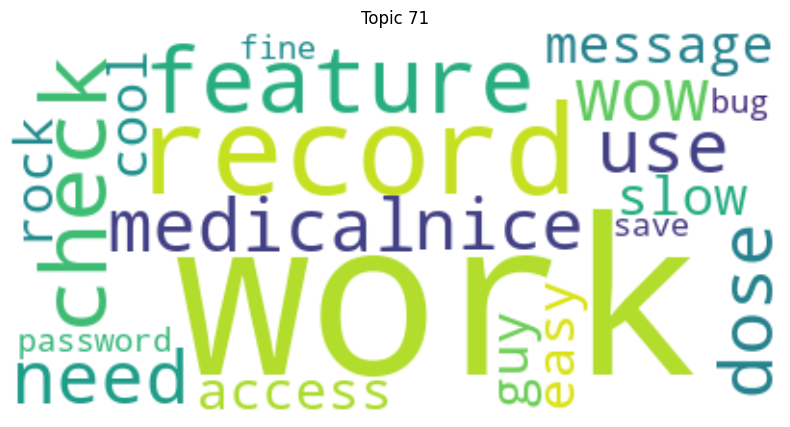

Top keywords for Topic 71: ['work', 'record', 'feature', 'check', 'medical', 'use', 'wow', 'dose', 'need', 'nice', 'message', 'slow', 'easy', 'cool', 'like', 'guy', 'rock', 'access', 'password', 'save']


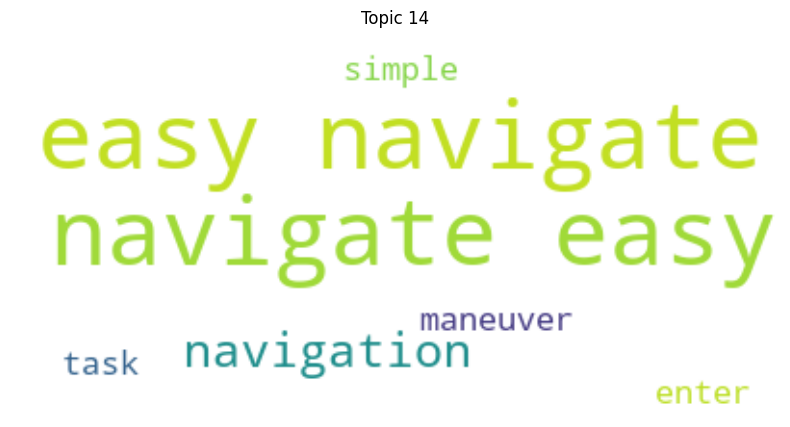

Top keywords for Topic 14: ['easy', 'navigate', 'navigation', 'maneuver', 'task', 'simple', 'enter']


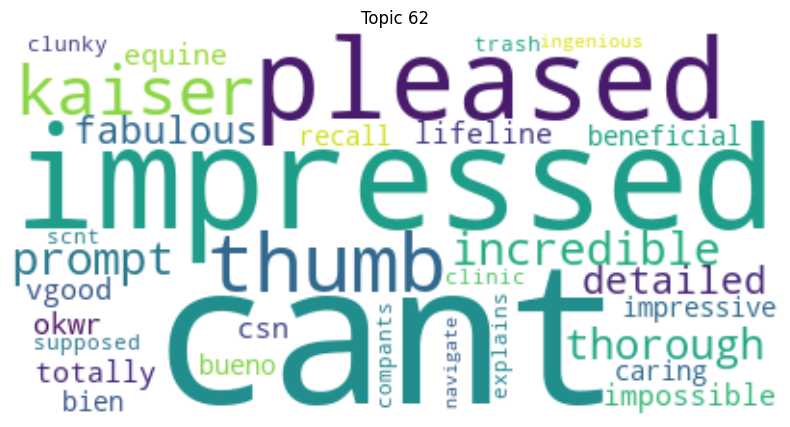

Top keywords for Topic 62: ['cant', 'impressed', 'pleased', 'thumb', 'kaiser', 'incredible', 'prompt', 'thorough', 'fabulous', 'detailed', 'totally', 'okwr', 'impossible', 'equine', 'lifeline', 'csn', 'vgood', 'impressive', 'beneficial', 'recall']


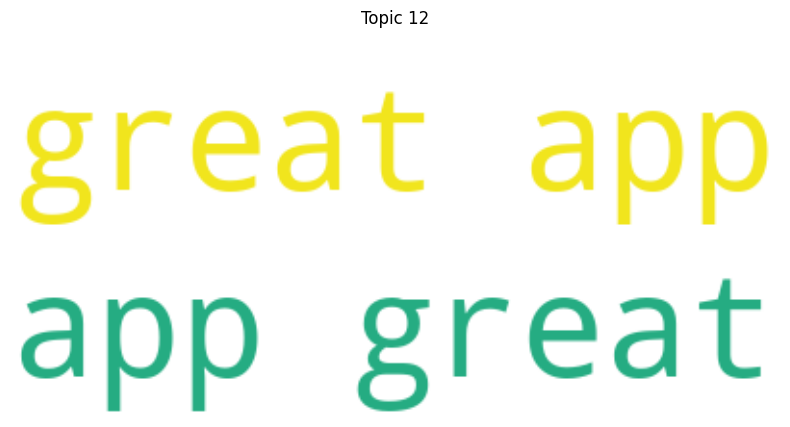

Top keywords for Topic 12: ['great', 'app']


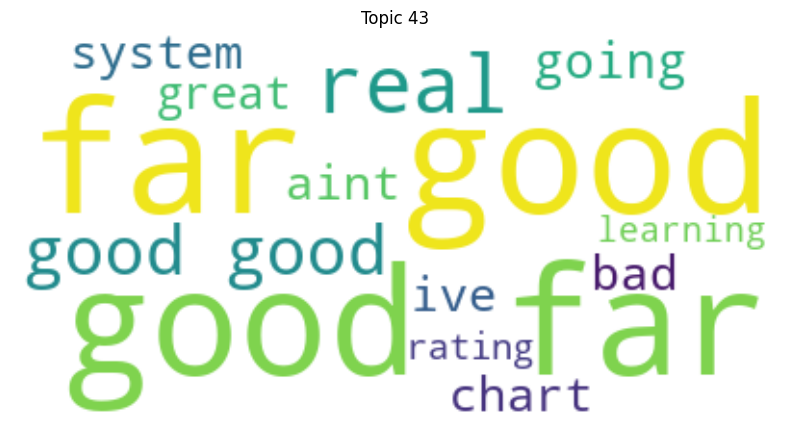

Top keywords for Topic 43: ['good', 'far', 'real', 'going', 'system', 'aint', 'bad', 'it', 'chart', 'ive', 'great', 'rating', 'learning']


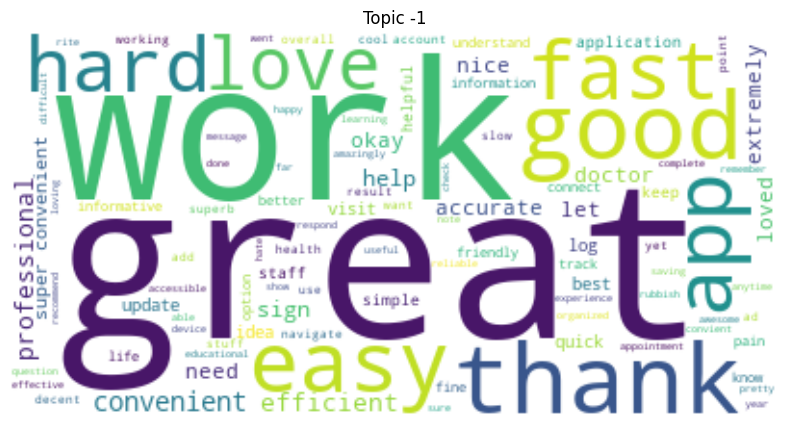

Top keywords for Topic -1: ['great', 'work', 'good', 'convenient', 'easy', 'fast', 'hard', 'thank', 'love', 'efficient', 'professional', 'sign', 'help', 'loved', 'okay', 'this', 'doctor', 'extremely', 'accurate', 'nice']


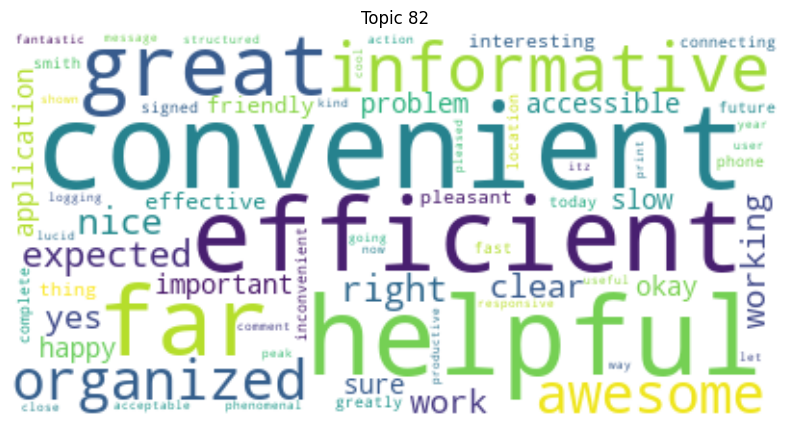

Top keywords for Topic 82: ['convenient', 'helpful', 'efficient', 'far', 'great', 'informative', 'organized', 'awesome', 'expected', 'nice', 'right', 'yes', 'work', 'working', 'clear', 'okay', 'problem', 'happy', 'important', 'sure']


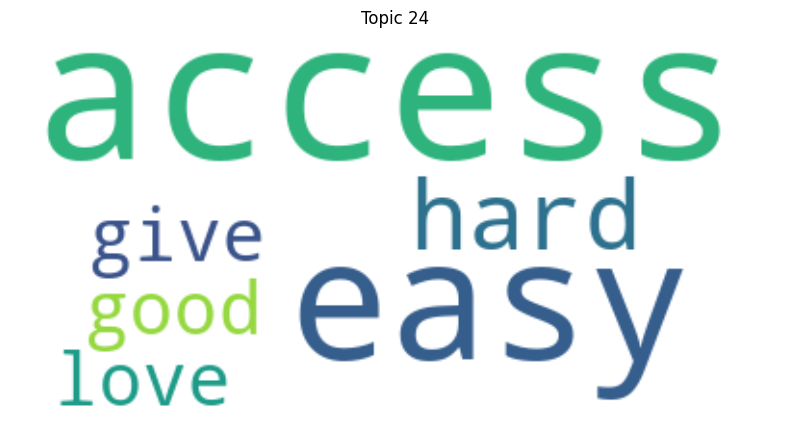

Top keywords for Topic 24: ['access', 'easy', 'hard', 'give', 'love', 'good']


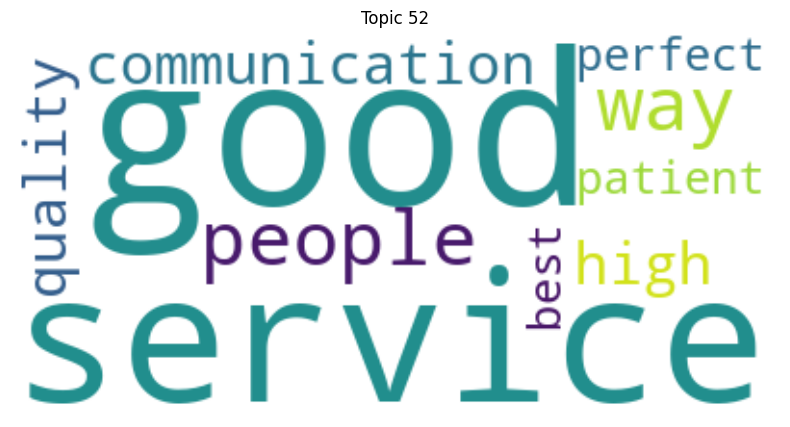

Top keywords for Topic 52: ['good', 'service', 'people', 'way', 'high', 'quality', 'communication', 'patient', 'perfect', 'best']


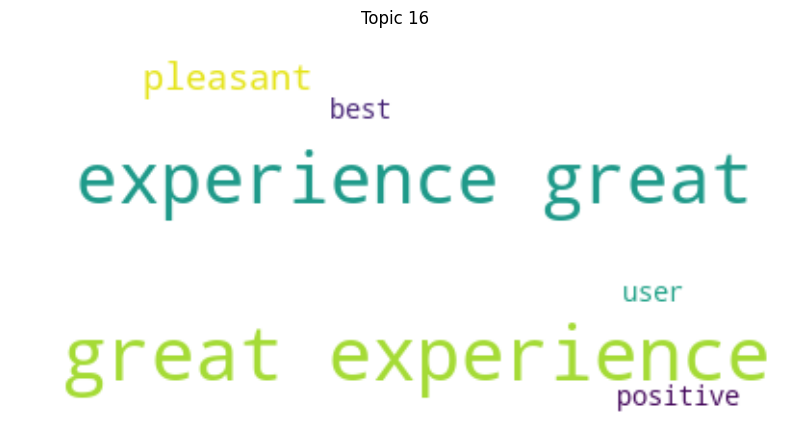

Top keywords for Topic 16: ['experience', 'great', 'pleasant', 'user', 'positive', 'best']


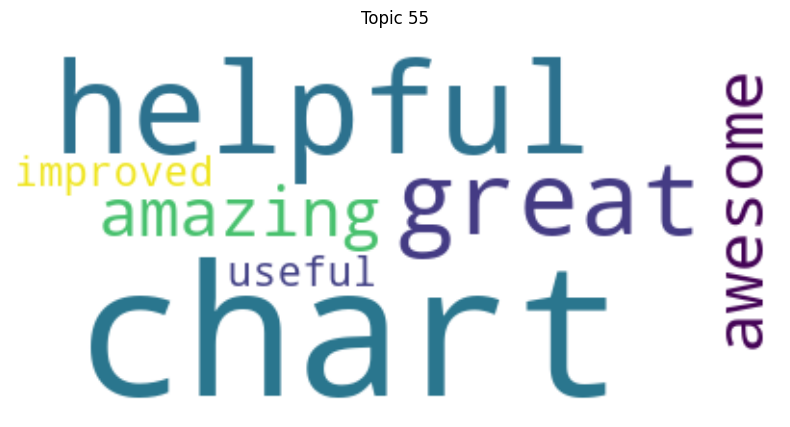

Top keywords for Topic 55: ['chart', 'helpful', 'great', 'amazing', 'awesome', 'improved', 'useful']


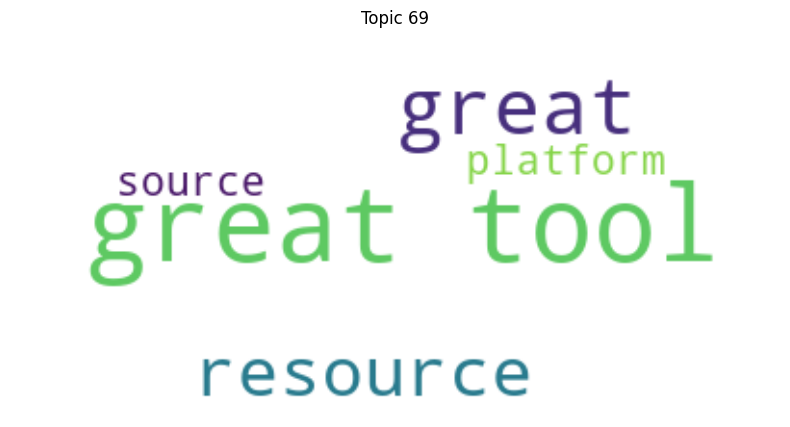

Top keywords for Topic 69: ['great', 'tool', 'resource', 'platform', 'source']


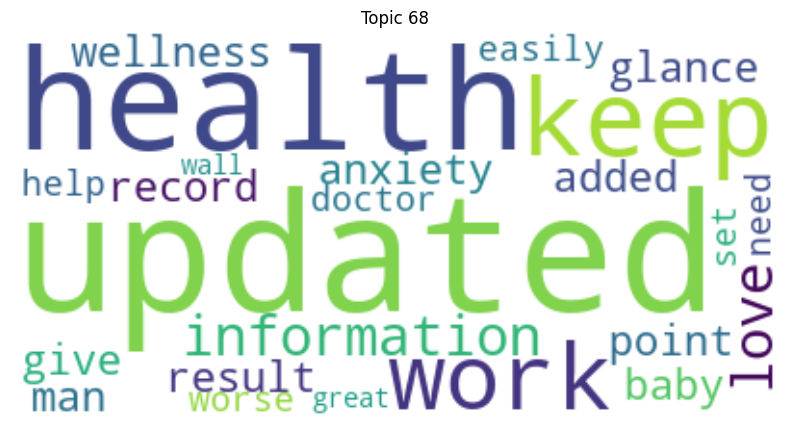

Top keywords for Topic 68: ['updated', 'health', 'keep', 'work', 'information', 'love', 'record', 'result', 'added', 'glance', 'give', 'anxiety', 'point', 'man', 'baby', 'wellness', 'easily', 'doctor', 'help', 'set']


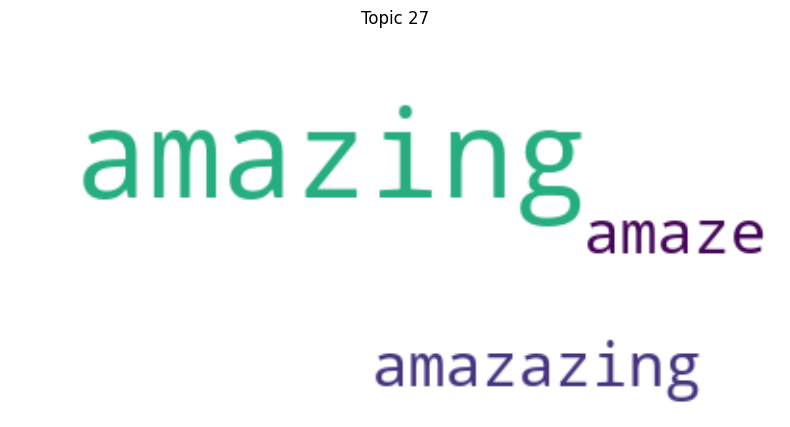

Top keywords for Topic 27: ['amazing', 'amaze', 'amazazing']


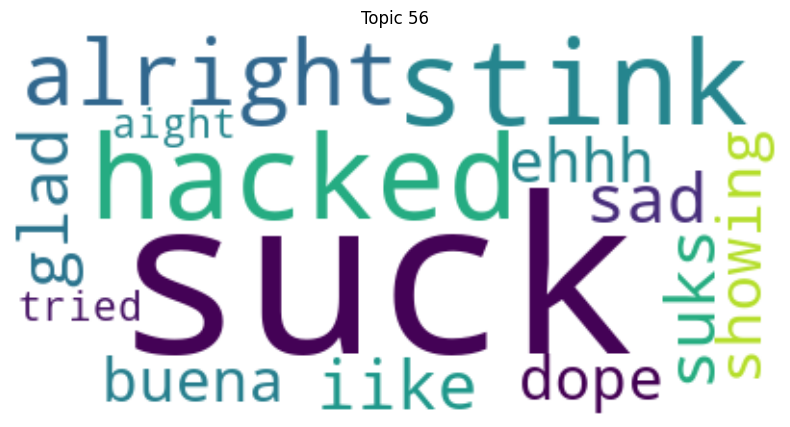

Top keywords for Topic 56: ['suck', 'hacked', 'stink', 'alright', 'suks', 'sad', 'iike', 'glad', 'dope', 'buena', 'showing', 'ehhh', 'aight', 'tried']


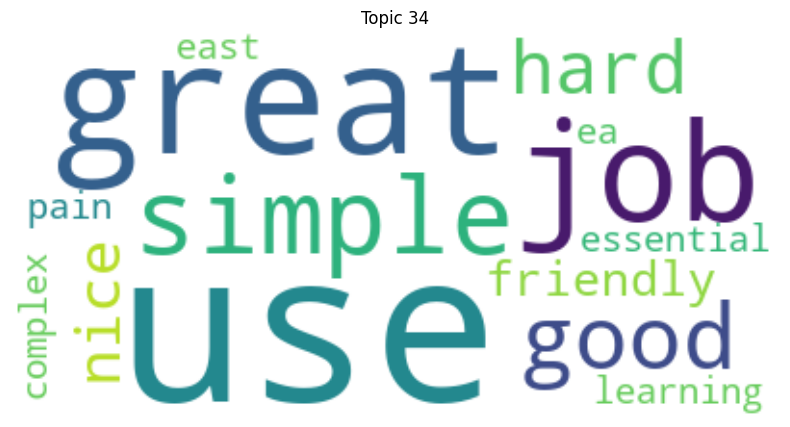

Top keywords for Topic 34: ['use', 'great', 'job', 'simple', 'good', 'hard', 'nice', 'friendly', 'east', 'learning', 'ea', 'essential', 'pain', 'complex']


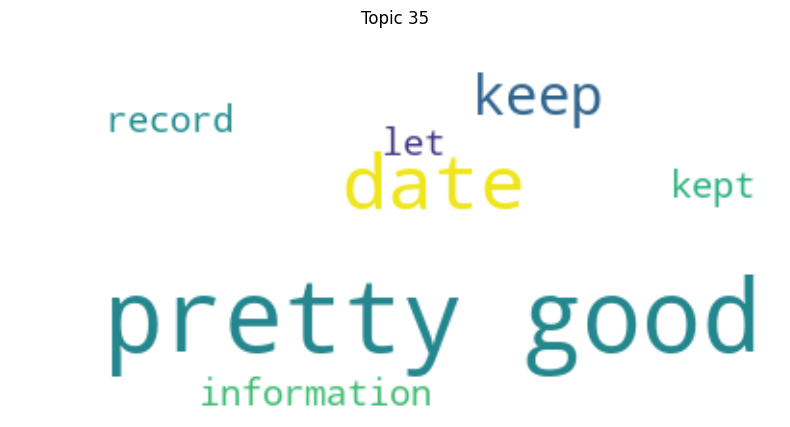

Top keywords for Topic 35: ['pretty', 'good', 'date', 'keep', 'information', 'record', 'kept', 'let']


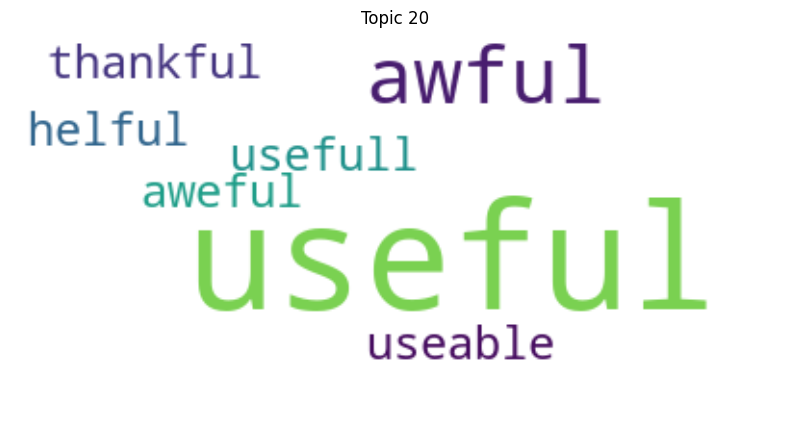

Top keywords for Topic 20: ['useful', 'awful', 'usefull', 'useable', 'aweful', 'helful', 'thankful']


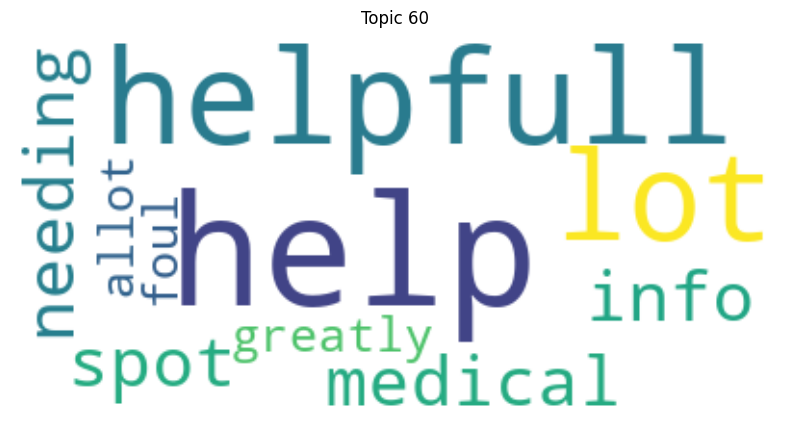

Top keywords for Topic 60: ['help', 'helpfull', 'lot', 'medical', 'info', 'spot', 'needing', 'greatly', 'foul', 'allot']


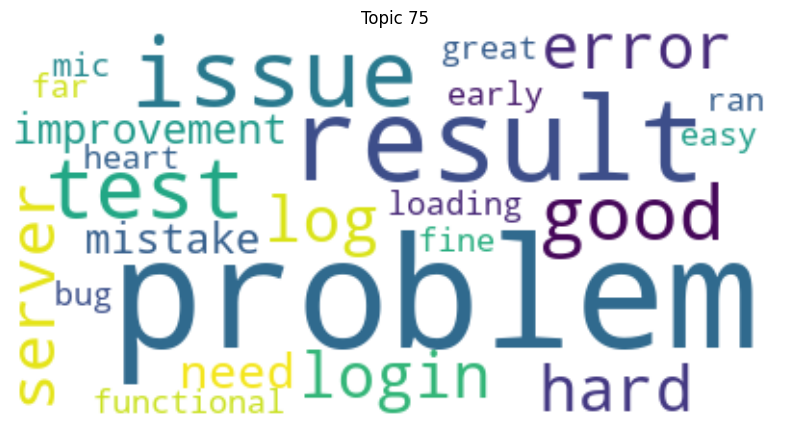

Top keywords for Topic 75: ['problem', 'result', 'issue', 'test', 'good', 'log', 'hard', 'login', 'server', 'error', 'need', 'improvement', 'this', 'mistake', 'functional', 'bug', 'far', 'ran', 'loading', 'early']


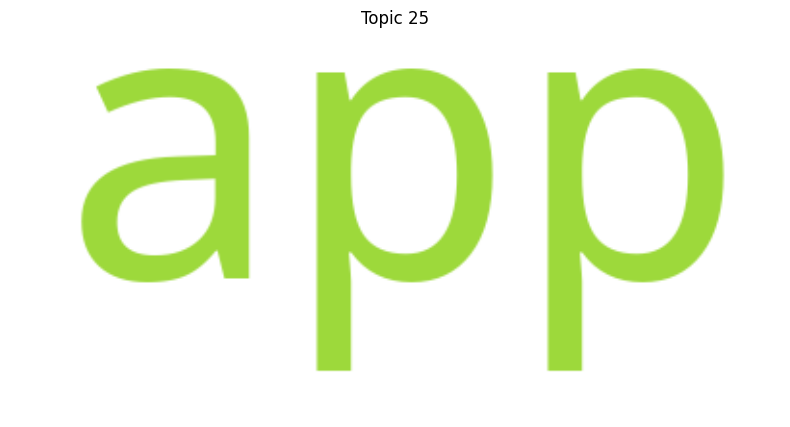

Top keywords for Topic 25: ['like', 'app']


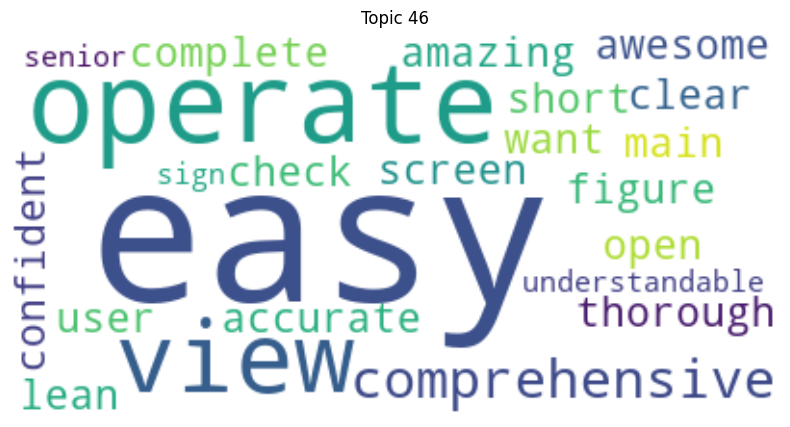

Top keywords for Topic 46: ['easy', 'operate', 'view', 'comprehensive', 'user', 'want', 'short', 'amazing', 'clear', 'thorough', 'figure', 'check', 'open', 'awesome', 'complete', 'lean', 'accurate', 'confident', 'main', 'screen']


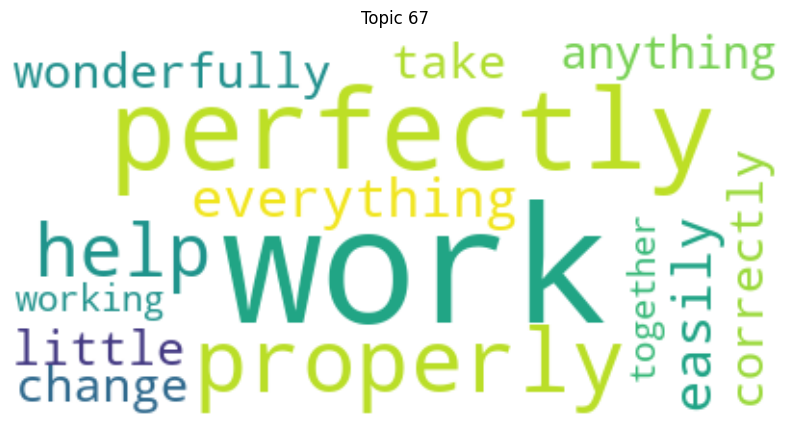

Top keywords for Topic 67: ['work', 'perfectly', 'properly', 'help', 'everything', 'easily', 'wonderfully', 'like', 'all', 'take', 'little', 'correctly', 'change', 'anything', 'working', 'together']


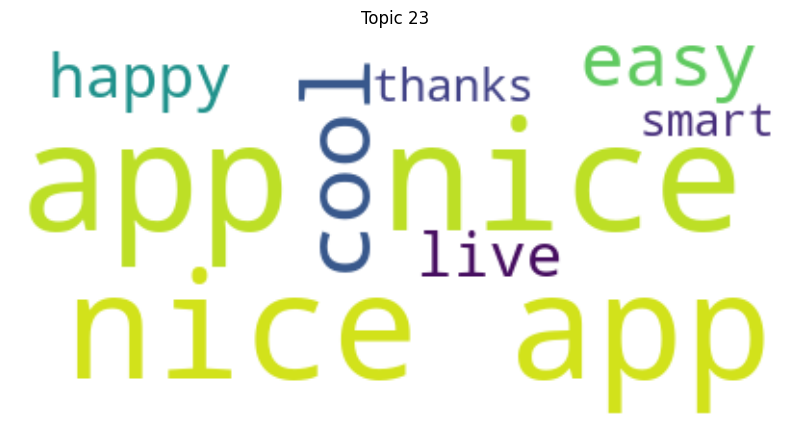

Top keywords for Topic 23: ['app', 'nice', 'cool', 'easy', 'live', 'happy', 'thanks', 'smart']


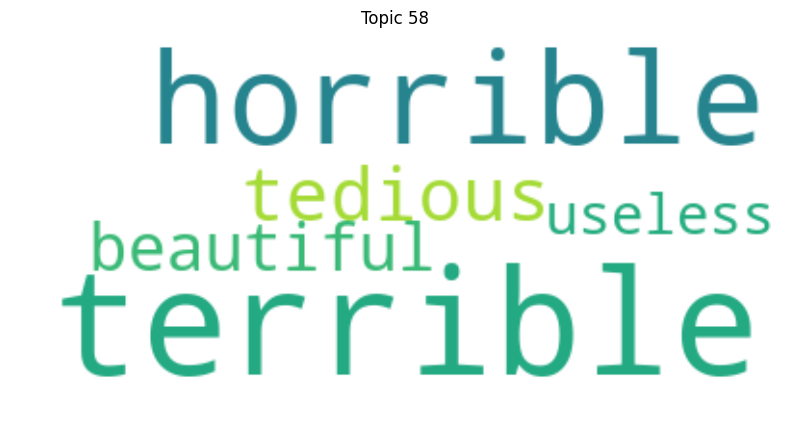

Top keywords for Topic 58: ['terrible', 'horrible', 'tedious', 'beautiful', 'useless']


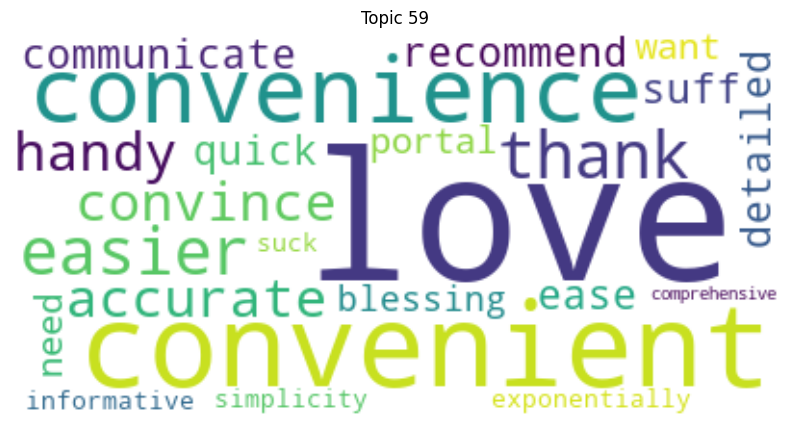

Top keywords for Topic 59: ['love', 'convenient', 'convenience', 'like', 'thank', 'easier', 'convince', 'accurate', 'handy', 'detailed', 'suff', 'communicate', 'ease', 'recommend', 'quick', 'portal', 'need', 'want', 'blessing', 'exponentially']


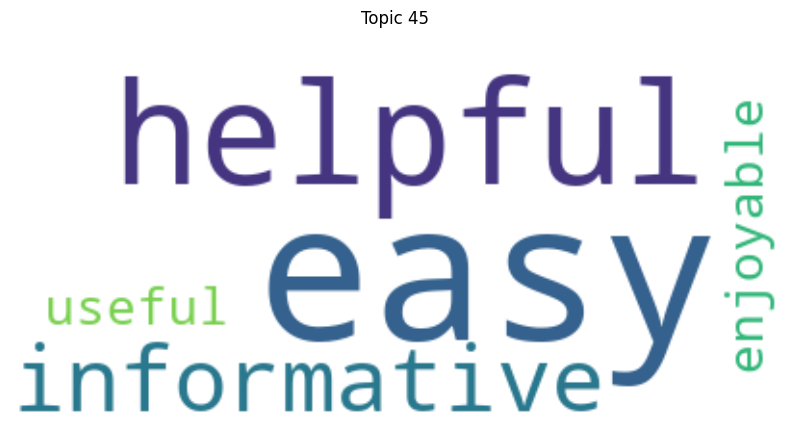

Top keywords for Topic 45: ['easy', 'helpful', 'informative', 'ever', 'useful', 'enjoyable']


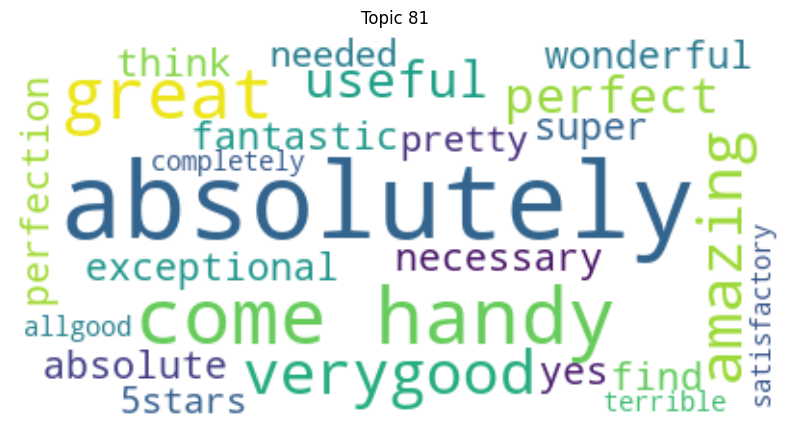

Top keywords for Topic 81: ['absolutely', 'come', 'handy', 'great', 'amazing', 'verygood', 'perfect', 'useful', 'super', 'exceptional', 'wonderful', 'fantastic', 'yes', 'necessary', 'absolute', 'perfection', 'think', 'find', 'pretty', 'needed']


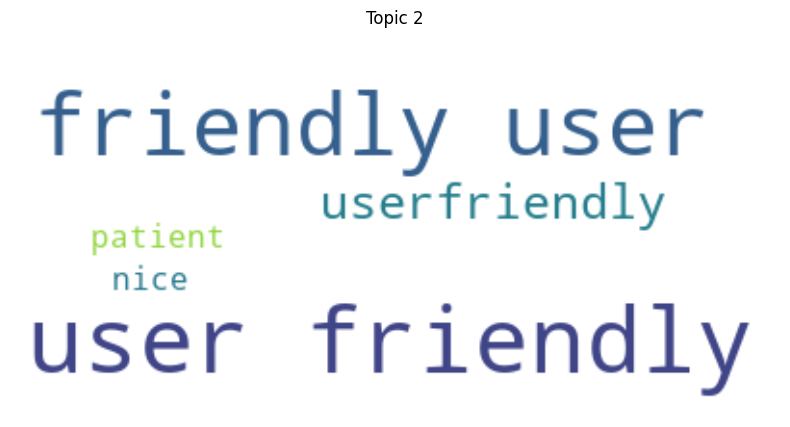

Top keywords for Topic 2: ['friendly', 'user', 'userfriendly', 'nice', 'patient']


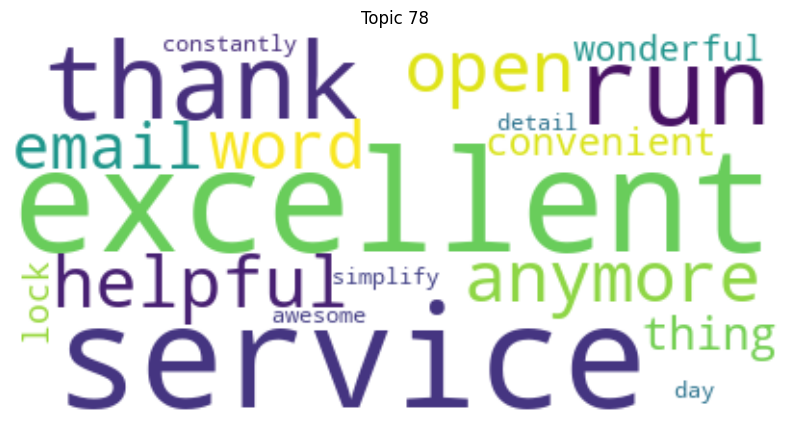

Top keywords for Topic 78: ['like', 'excellent', 'service', 'run', 'thank', 'helpful', 'open', 'anymore', 'word', 'email', 'thing', 'convenient', 'wonderful', 'lock', 'constantly', 'detail', 'simplify', 'day', 'awesome']


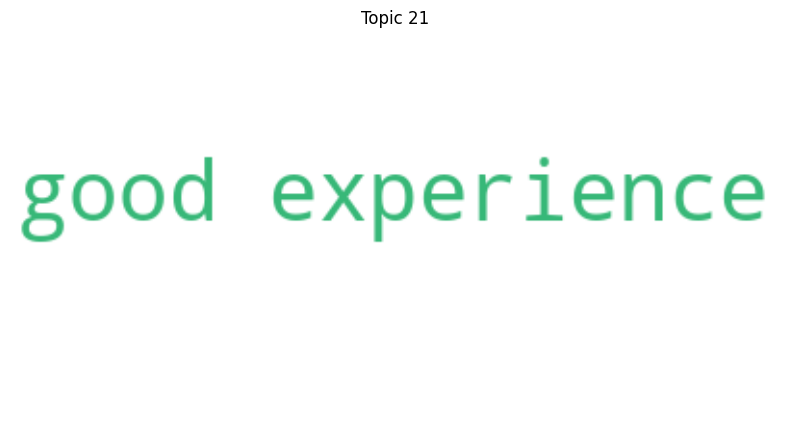

Top keywords for Topic 21: ['good', 'experience']


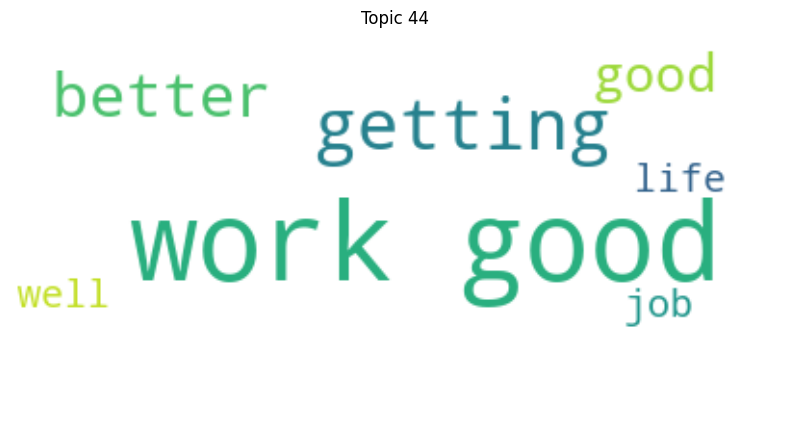

Top keywords for Topic 44: ['good', 'work', 'getting', 'better', 'life', 'job', 'well']


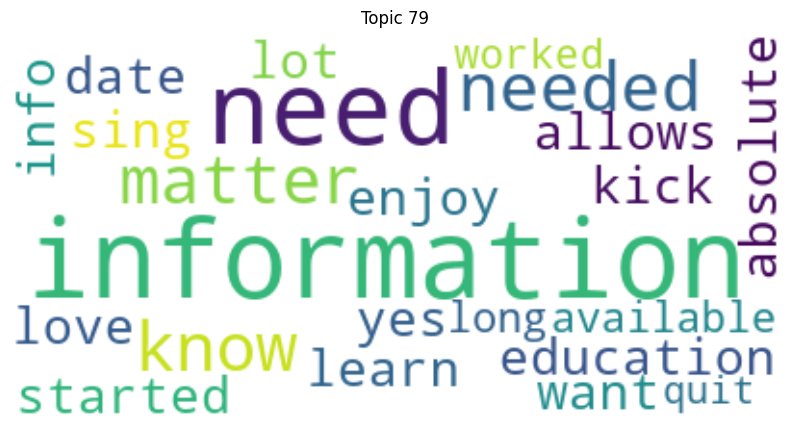

Top keywords for Topic 79: ['information', 'need', 'matter', 'needed', 'know', 'education', 'kick', 'lot', 'learn', 'yes', 'enjoy', 'started', 'sing', 'date', 'absolute', 'have', 'allows', 'want', 'love', 'info']


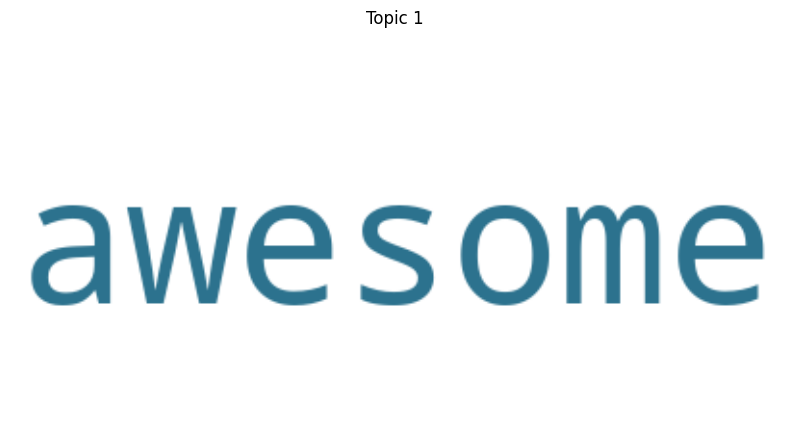

Top keywords for Topic 1: ['awesome']


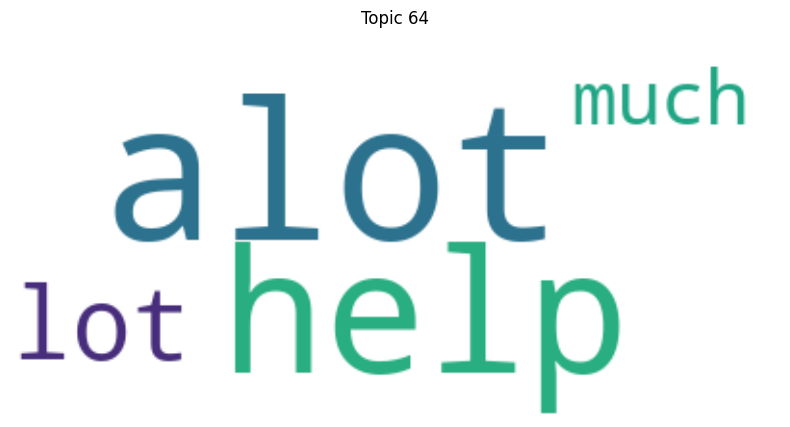

Top keywords for Topic 64: ['alot', 'help', 'like', 'lot', 'much']


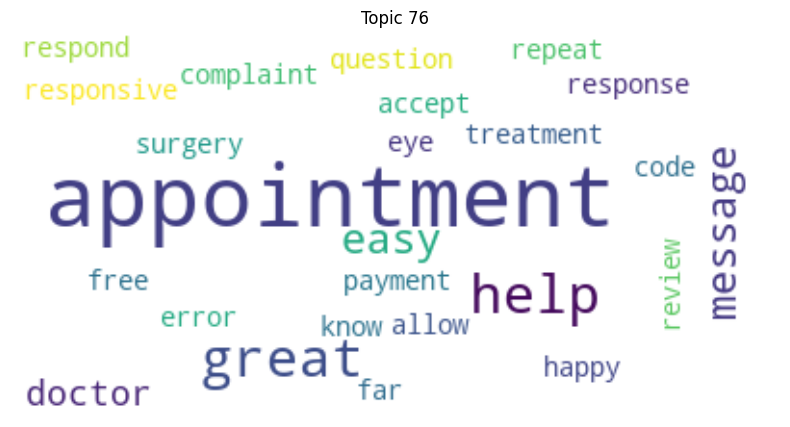

Top keywords for Topic 76: ['appointment', 'great', 'help', 'message', 'easy', 'doctor', 'repeat', 'happy', 'treatment', 'response', 'eye', 'surgery', 'know', 'responsive', 'review', 'allow', 'respond', 'question', 'accept', 'payment']


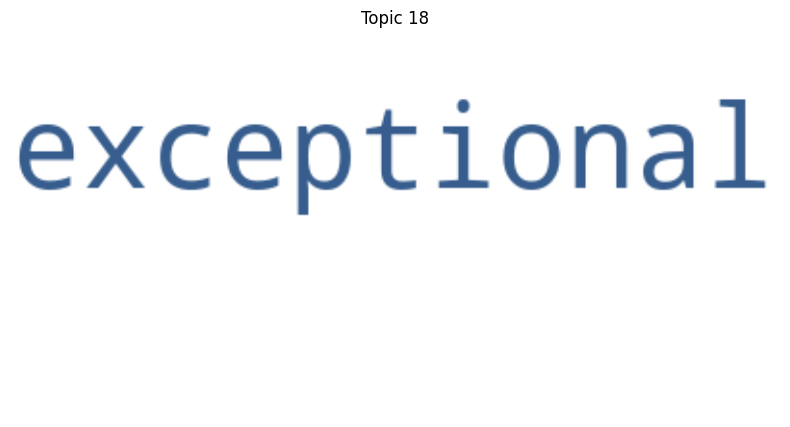

Top keywords for Topic 18: ['exceptional']


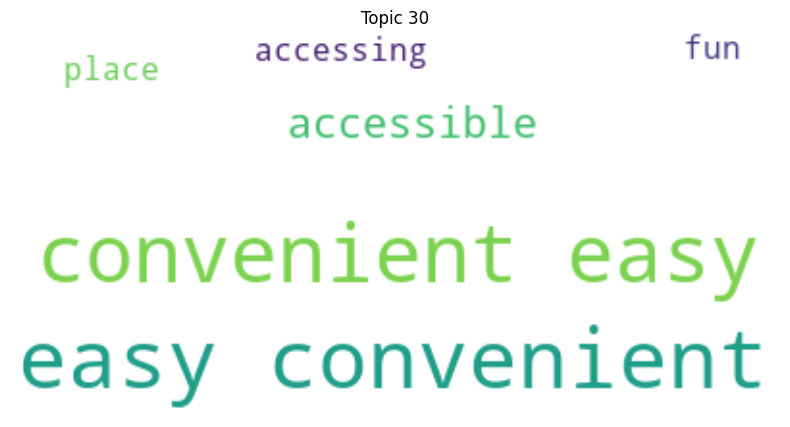

Top keywords for Topic 30: ['easy', 'convenient', 'accessible', 'place', 'fun', 'accessing']


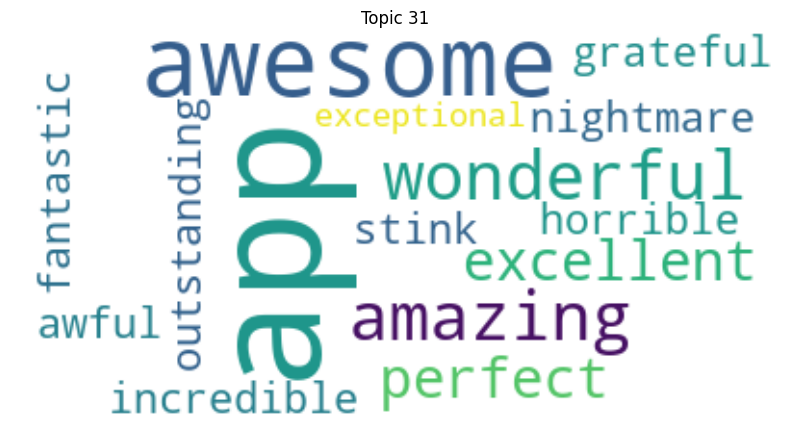

Top keywords for Topic 31: ['app', 'awesome', 'wonderful', 'amazing', 'excellent', 'perfect', 'nightmare', 'awful', 'stink', 'horrible', 'incredible', 'outstanding', 'fantastic', 'grateful', 'exceptional']


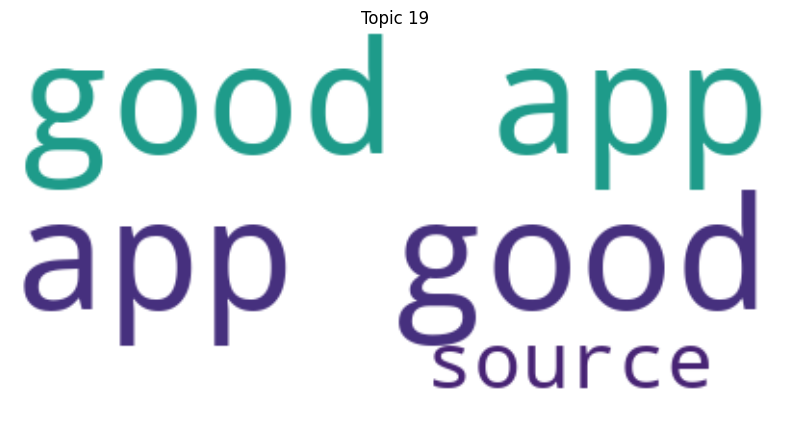

Top keywords for Topic 19: ['good', 'app', 'source']


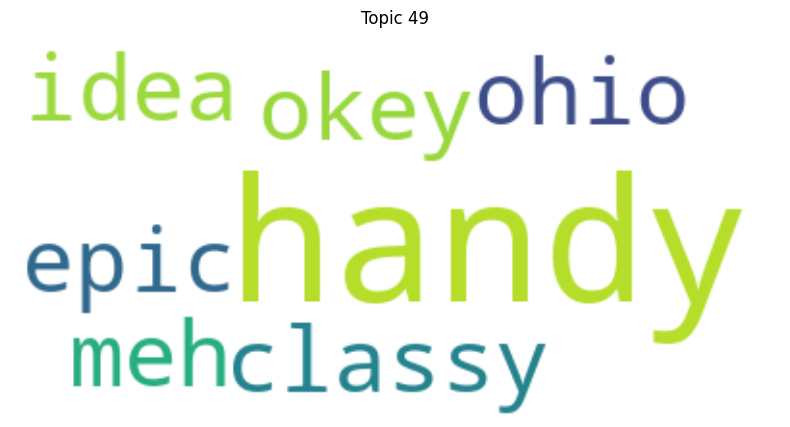

Top keywords for Topic 49: ['handy', 'ohio', 'meh', 'classy', 'idea', 'okey', 'epic']


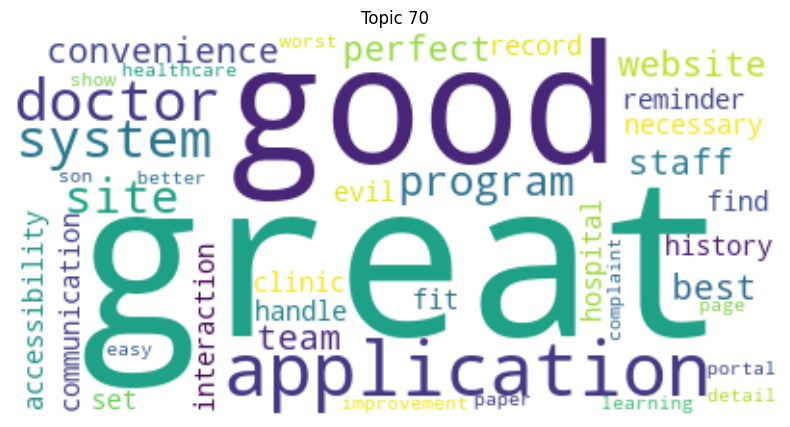

Top keywords for Topic 70: ['great', 'good', 'application', 'doctor', 'system', 'site', 'program', 'website', 'perfect', 'team', 'best', 'convenience', 'staff', 'reminder', 'accessibility', 'necessary', 'evil', 'set', 'interaction', 'history']


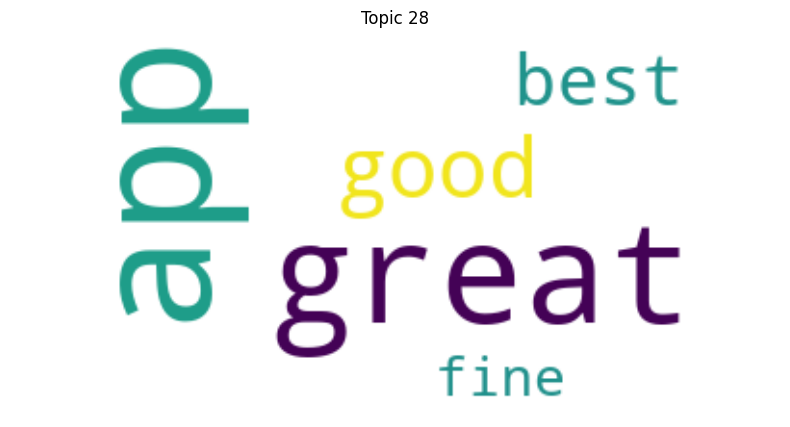

Top keywords for Topic 28: ['app', 'great', 'good', 'best', 'fine']


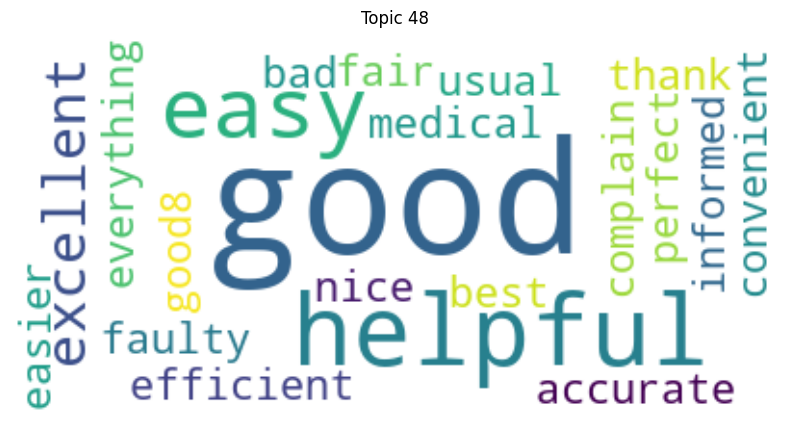

Top keywords for Topic 48: ['good', 'helpful', 'easy', 'excellent', 'like', 'usual', 'convenient', 'faulty', 'accurate', 'efficient', 'bad', 'medical', 'everything', 'complain', 'thank', 'informed', 'have', 'perfect', 'fair', 'nice']


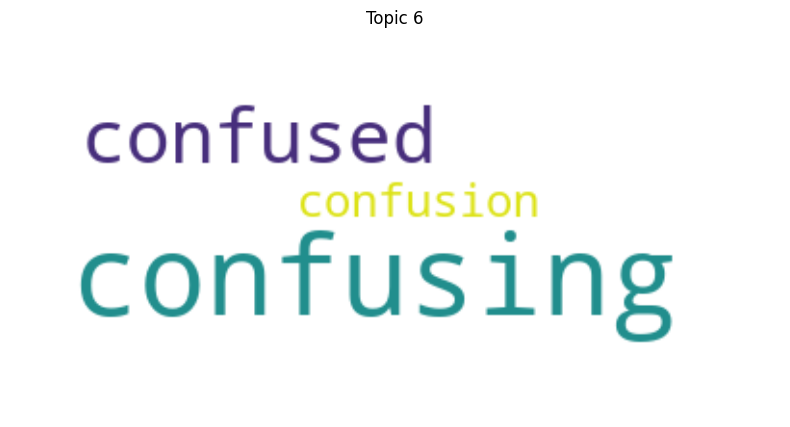

Top keywords for Topic 6: ['confusing', 'confused', 'confusion']


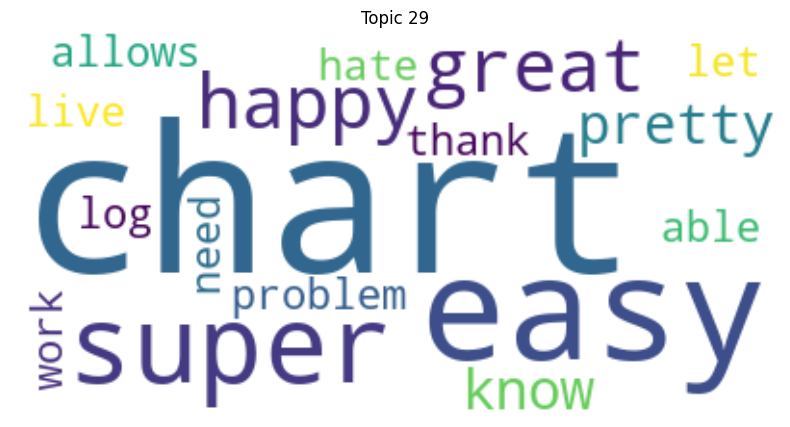

Top keywords for Topic 29: ['chart', 'easy', 'like', 'super', 'happy', 'great', 'pretty', 'know', 'hate', 'able', 'problem', 'allows', 'work', 'live', 'let', 'need', 'log', 'thank']


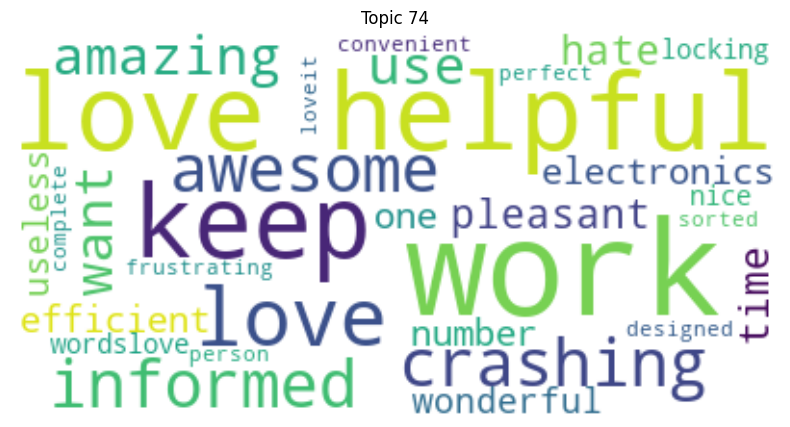

Top keywords for Topic 74: ['love', 'work', 'helpful', 'keep', 'crashing', 'informed', 'awesome', 'amazing', 'want', 'use', 'time', 'pleasant', 'hate', 'electronics', 'efficient', 'number', 'one', 'wonderful', 'useless', 'locking']


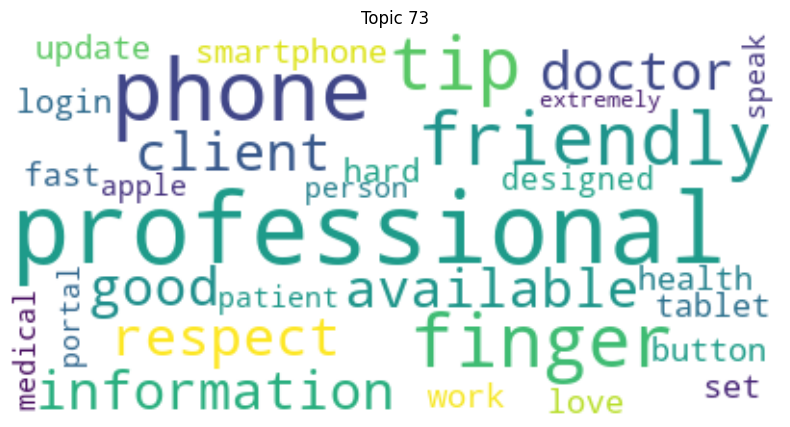

Top keywords for Topic 73: ['professional', 'phone', 'finger', 'tip', 'friendly', 'respect', 'client', 'available', 'information', 'doctor', 'good', 'smartphone', 'hard', 'set', 'health', 'button', 'fast', 'update', 'love', 'login']


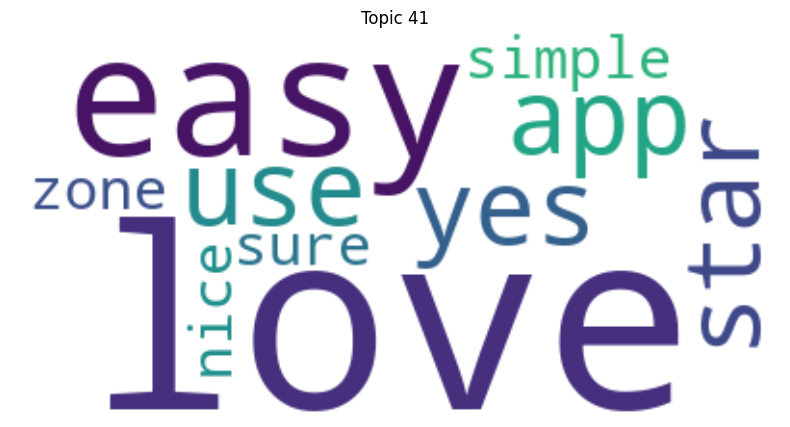

Top keywords for Topic 41: ['love', 'easy', 'star', 'yes', 'app', 'use', 'simple', 'zone', 'sure', 'nice']


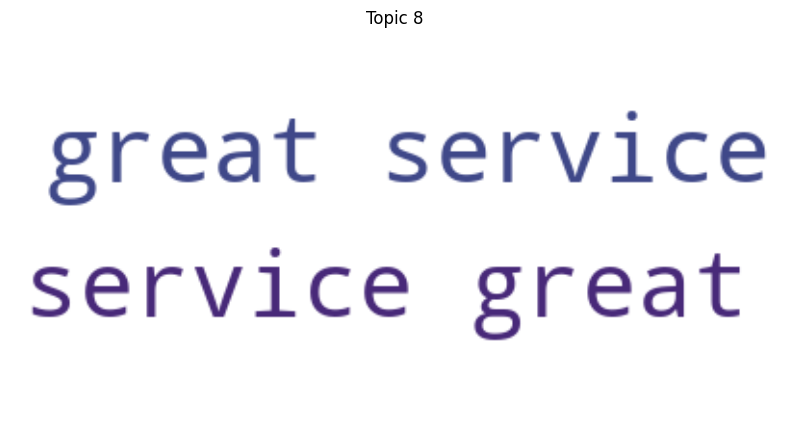

Top keywords for Topic 8: ['great', 'service']


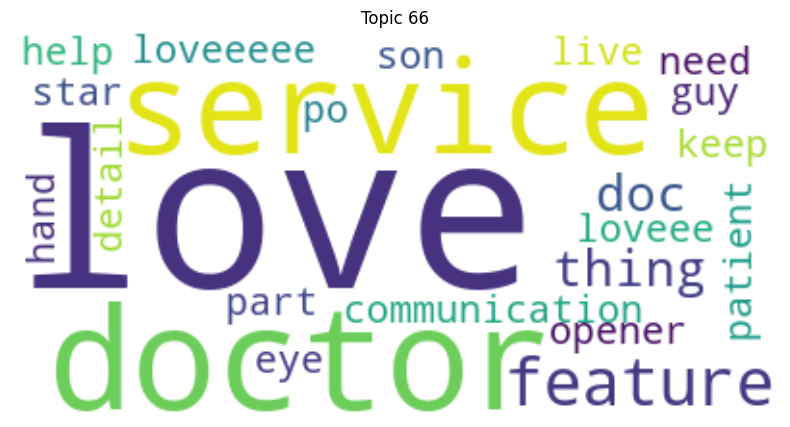

Top keywords for Topic 66: ['love', 'doctor', 'service', 'feature', 'doc', 'thing', 'like', 'live', 'communication', 'son', 'patient', 'loveeeee', 'eye', 'opener', 'keep', 'star', 'loveee', 'need', 'po', 'part']


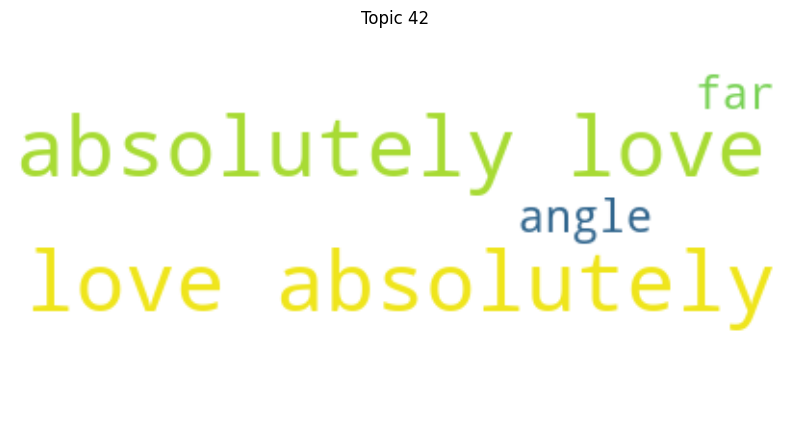

Top keywords for Topic 42: ['love', 'absolutely', 'angle', 'far']


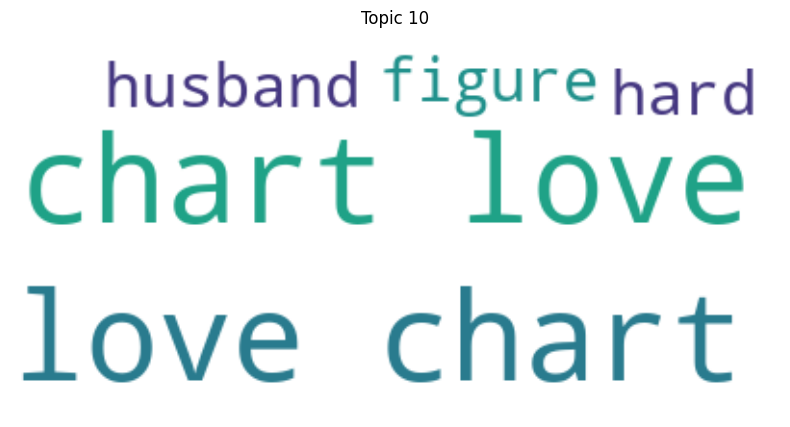

Top keywords for Topic 10: ['chart', 'love', 'husband', 'hard', 'figure']


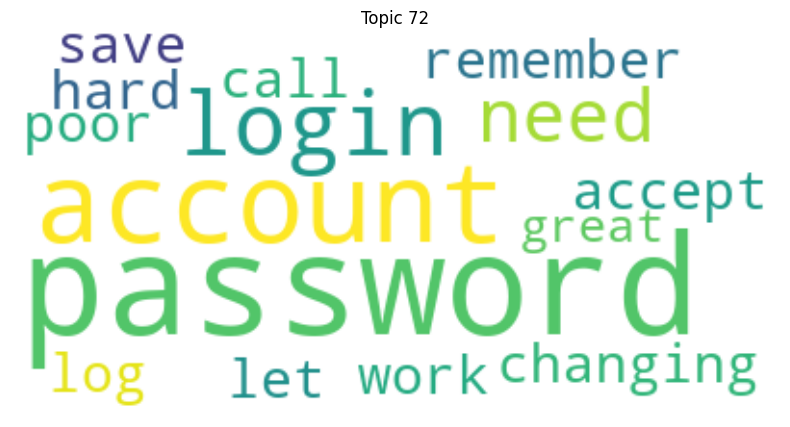

Top keywords for Topic 72: ['password', 'account', 'login', 'need', 'hard', 'changing', 'accept', 'like', 'let', 'work', 'call', 'remember', 'log', 'save', 'poor', 'great']


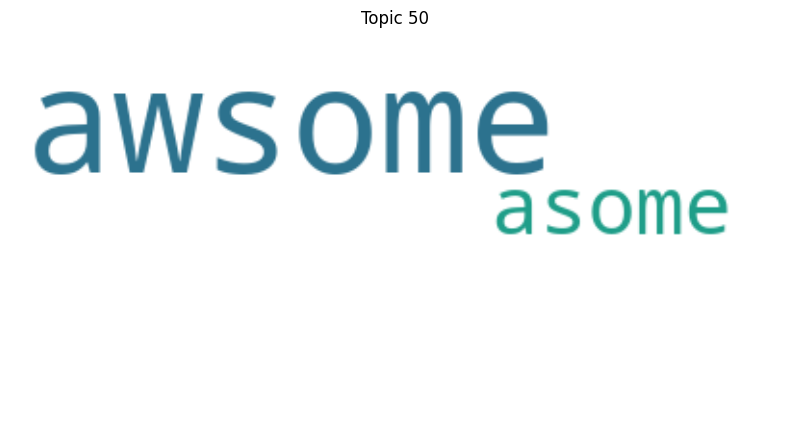

Top keywords for Topic 50: ['awsome', 'asome']


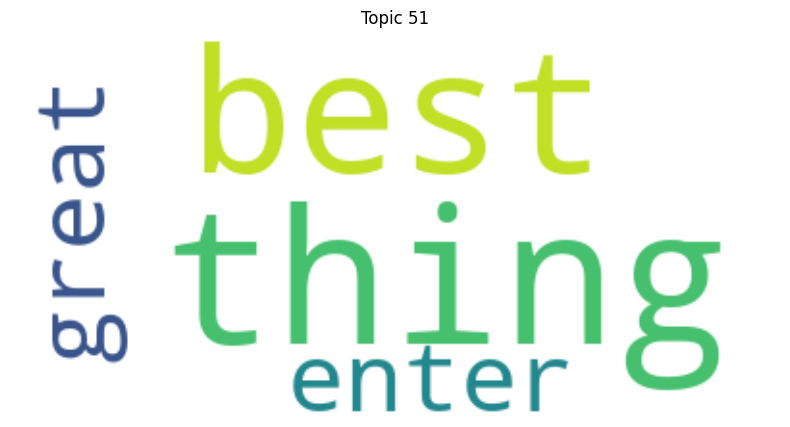

Top keywords for Topic 51: ['thing', 'best', 'enter', 'great']


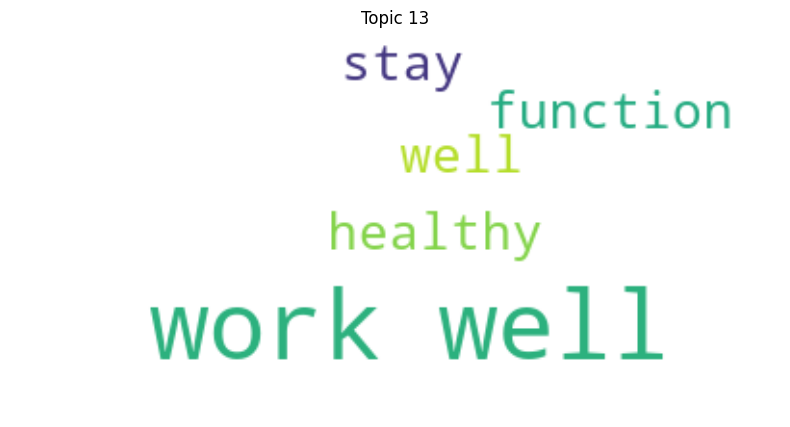

Top keywords for Topic 13: ['well', 'work', 'stay', 'healthy', 'function']


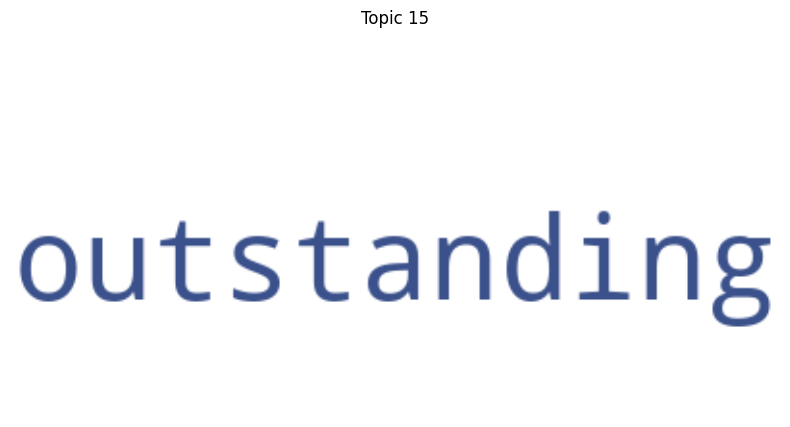

Top keywords for Topic 15: ['outstanding']


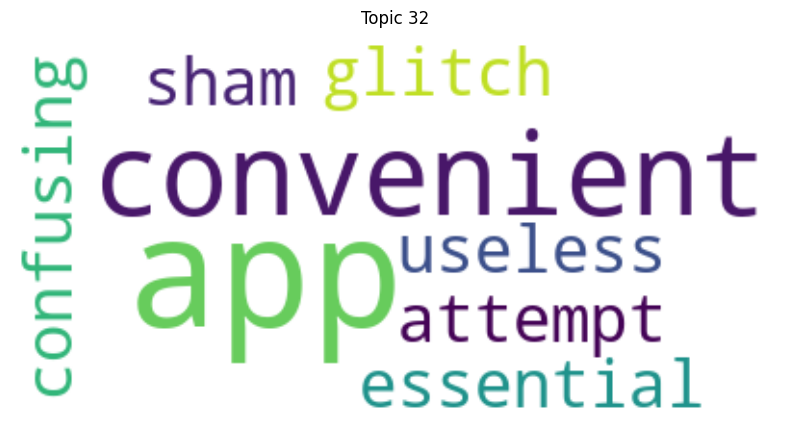

Top keywords for Topic 32: ['app', 'convenient', 'attempt', 'sham', 'glitch', 'essential', 'useless', 'confusing']


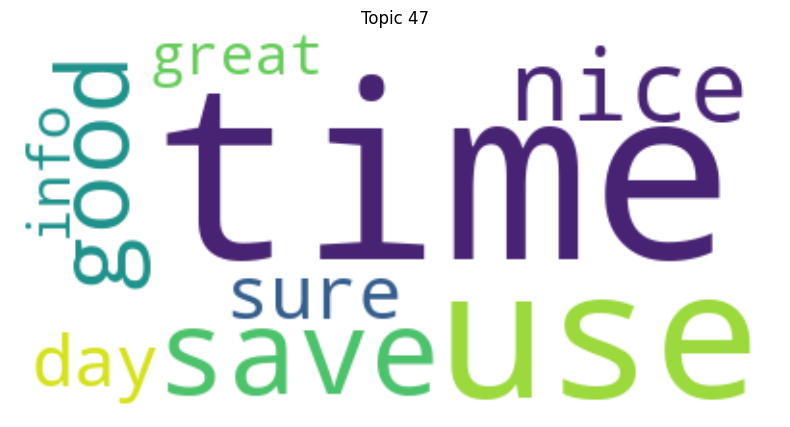

Top keywords for Topic 47: ['time', 'use', 'save', 'nice', 'good', 'sure', 'can', 'day', 'great', 'info']


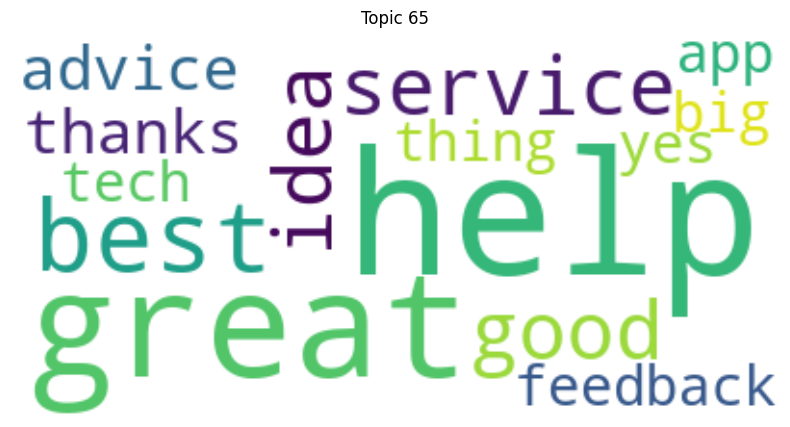

Top keywords for Topic 65: ['help', 'great', 'best', 'idea', 'service', 'good', 'advice', 'thanks', 'feedback', 'thing', 'tech', 'big', 'app', 'yes']


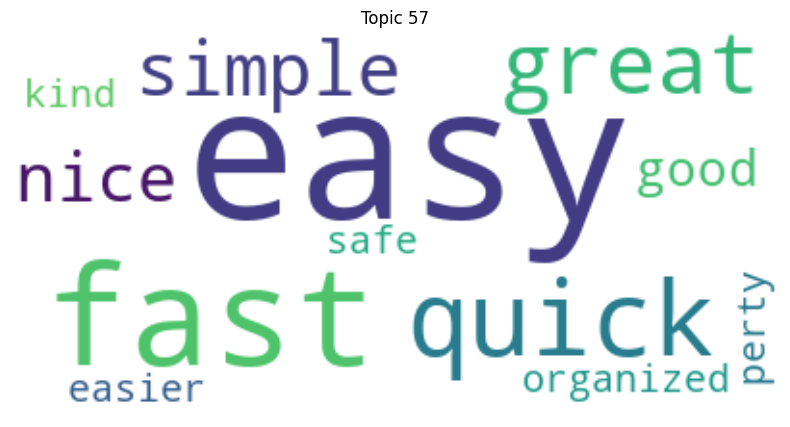

Top keywords for Topic 57: ['easy', 'fast', 'quick', 'great', 'simple', 'nice', 'good', 'easier', 'kind', 'perty', 'organized', 'safe']


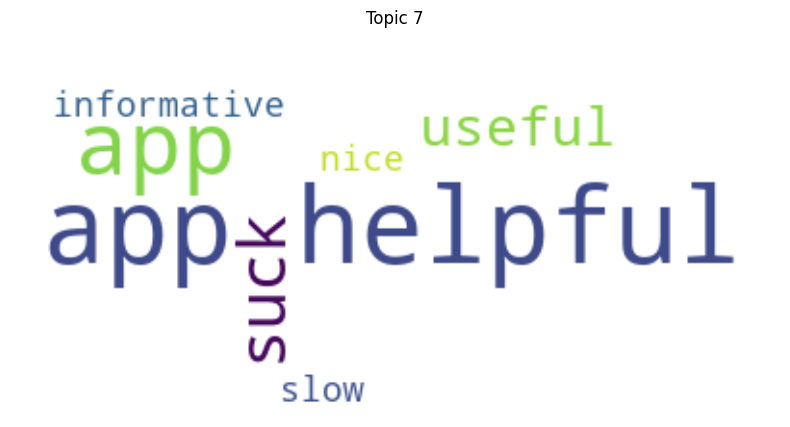

Top keywords for Topic 7: ['app', 'helpful', 'suck', 'useful', 'slow', 'nice', 'informative']


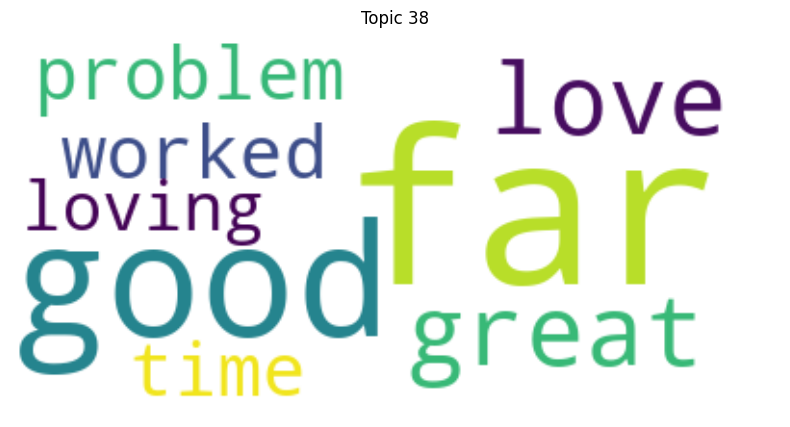

Top keywords for Topic 38: ['far', 'good', 'love', 'great', 'problem', 'time', 'worked', 'loving']


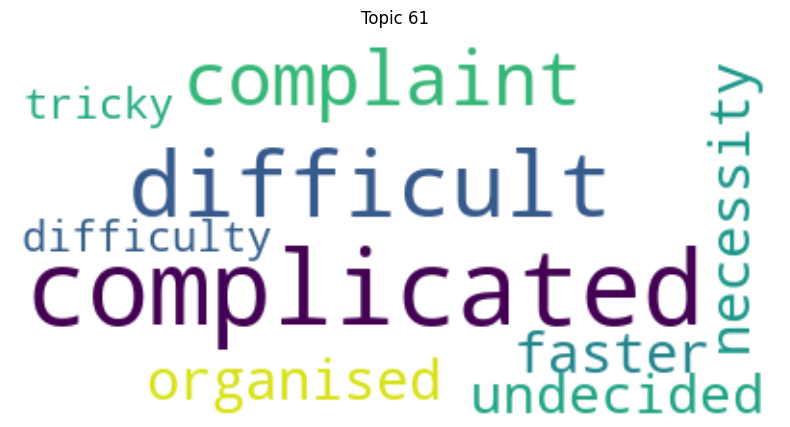

Top keywords for Topic 61: ['complicated', 'difficult', 'complaint', 'faster', 'organised', 'necessity', 'undecided', 'difficulty', 'tricky']


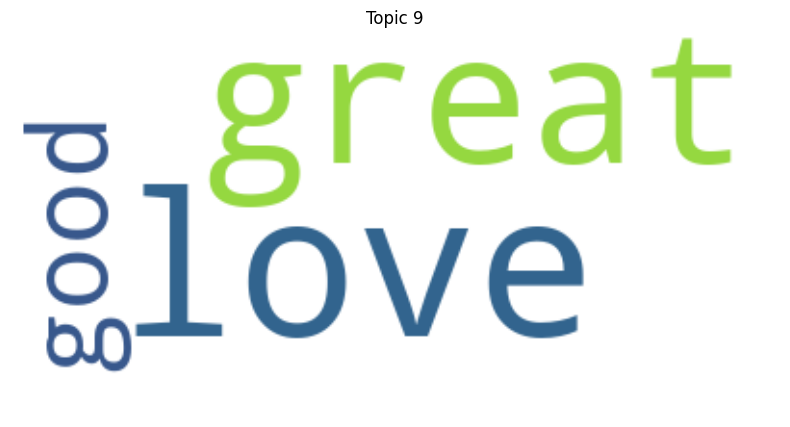

Top keywords for Topic 9: ['love', 'great', 'good']


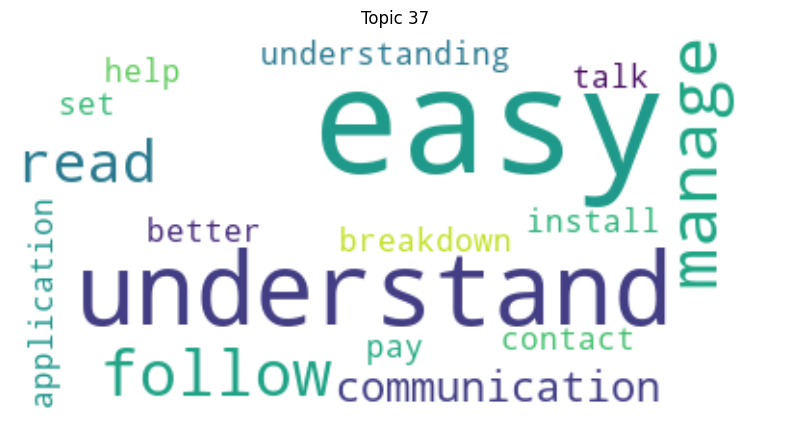

Top keywords for Topic 37: ['easy', 'understand', 'manage', 'follow', 'read', 'communication', 'application', 'understanding', 'contact', 'talk', 'pay', 'install', 'breakdown', 'help', 'set', 'better']


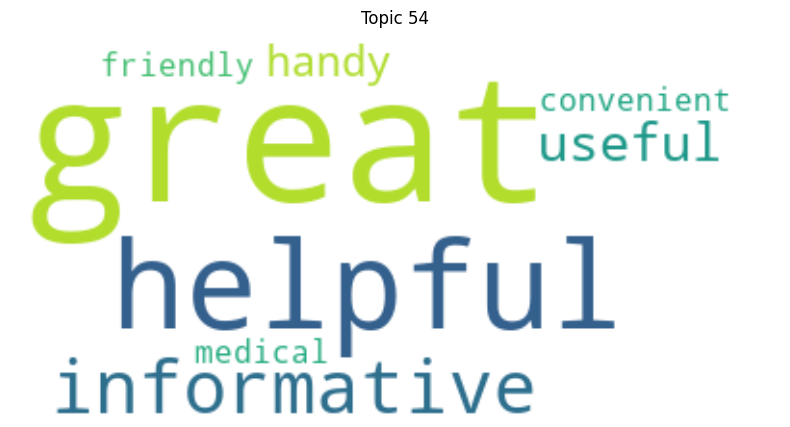

Top keywords for Topic 54: ['great', 'helpful', 'informative', 'useful', 'handy', 'friendly', 'convenient', 'medical']


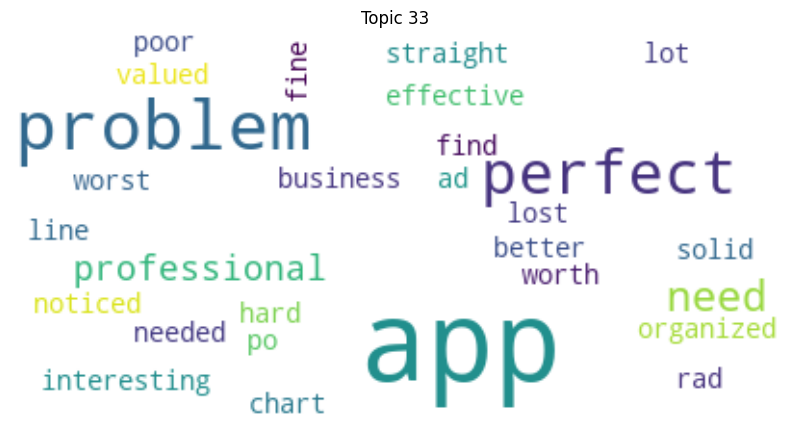

Top keywords for Topic 33: ['app', 'problem', 'perfect', 'need', 'professional', 'business', 'needed', 'valued', 'worst', 'interesting', 'hard', 'lost', 'poor', 'lot', 'effective', 'rad', 'line', 'find', 'worth', 'better']


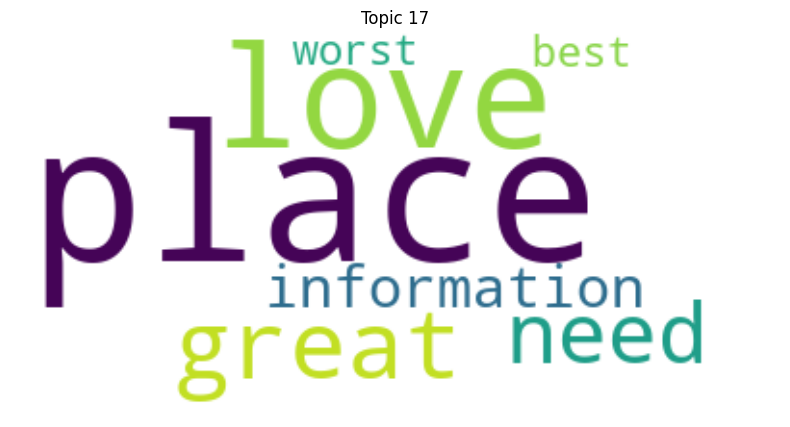

Top keywords for Topic 17: ['place', 'love', 'great', 'need', 'information', 'worst', 'best']


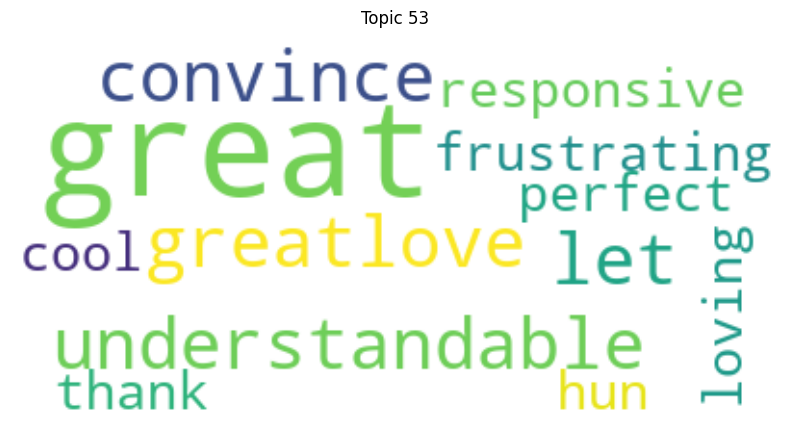

Top keywords for Topic 53: ['great', 'have', 'understandable', 'convince', 'let', 'greatlove', 'frustrating', 'responsive', 'perfect', 'thank', 'loving', 'cool', 'hun']


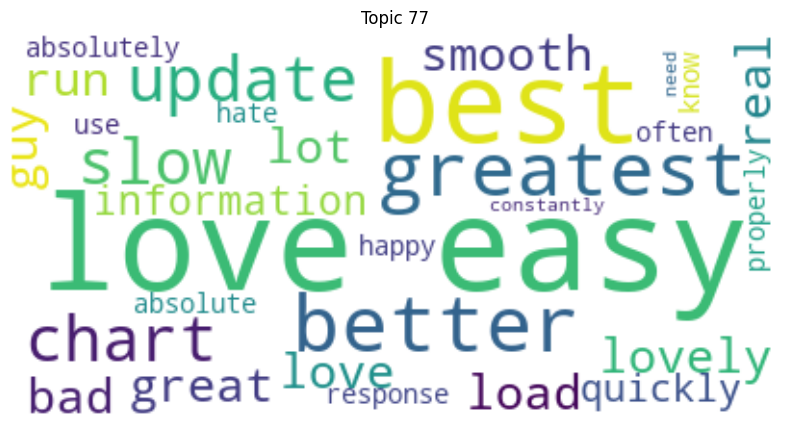

Top keywords for Topic 77: ['love', 'easy', 'best', 'better', 'greatest', 'chart', 'slow', 'update', 'lovely', 'bad', 'load', 'lot', 'run', 'smooth', 'great', 'like', 'real', 'guy', 'information', 'quickly']


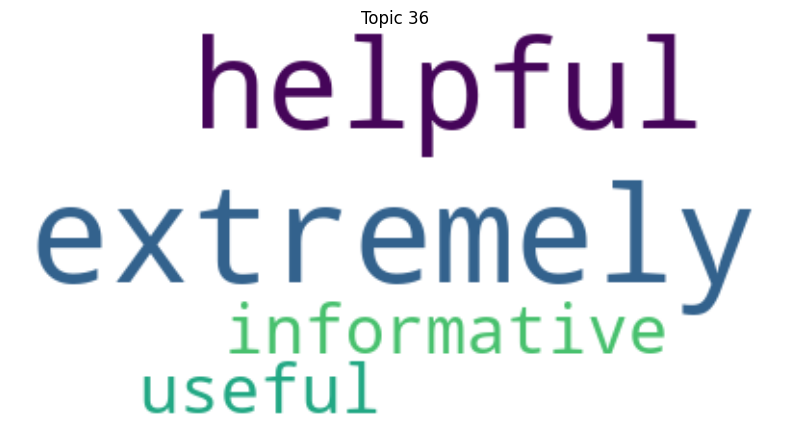

Top keywords for Topic 36: ['extremely', 'helpful', 'informative', 'useful']


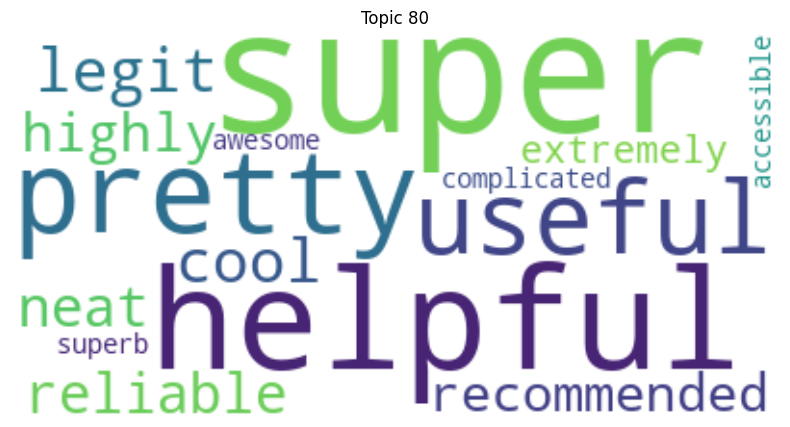

Top keywords for Topic 80: ['super', 'helpful', 'pretty', 'useful', 'legit', 'cool', 'reliable', 'neat', 'highly', 'recommended', 'extremely', 'complicated', 'superb', 'very', 'awesome', 'accessible']


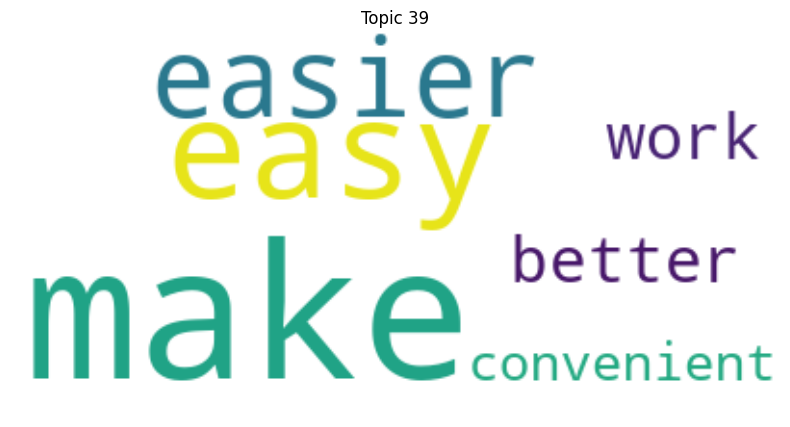

Top keywords for Topic 39: ['make', 'easy', 'easier', 'work', 'better', 'convenient']


In [11]:
# Word Clouds provide a visual summary of the most frequent words in each topic. 
# This can give us a quick understanding of the topic's theme.

from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import os

def save_and_show_word_clouds(df, directory="word_clouds"):
    if not os.path.exists(directory):
        os.makedirs(directory)
    
    topics = df['Topic'].unique()
    for topic in topics:
        text = " ".join(doc for doc in df[df['Topic'] == topic]['Review'])
        
        # Check if text is empty
        if not text.strip():
            print(f"Skipping Topic {topic} due to lack of text.")
            continue
        
        # Generate word cloud
        wordcloud = WordCloud(background_color="white", max_words=100).generate(text)
        
        # Save the word cloud to a file
        wordcloud_filename = f"{directory}/topic_{topic}.png"
        wordcloud.to_file(wordcloud_filename)
        
        # Display the word cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.title(f"Topic {topic}")
        plt.show()
        
        # Extract and display the top keywords
        words = text.split()
        most_common_words = Counter(words).most_common(20)  # Adjust the number of words as needed
        print(f"Top keywords for Topic {topic}: {[word for word, count in most_common_words]}")

# Replace 'documents' with your actual DataFrame variable name
# save_and_show_word_clouds(documents)


save_and_show_word_clouds(documents)


